In [1]:
# Low-Cost Deep Learning System for Automated Melanoma Detection
# Copyright (C) 2025 Nicolò Calandra
#
# This program is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.
#
# This program is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE. See the
# GNU General Public License for more details.
#
# You should have received a copy of the GNU General Public License
# along with this program. If not, see <https://www.gnu.org/licenses/>.

# Melanoma Detection using Deep Learning

## Overview

This notebook implements a binary classification system to distinguish between benign and malignant melanocytic skin lesions using convolutional neural networks (CNNs) and transfer learning.

## Objectives

- Build a high-recall classifier to minimize missed melanoma cases
- Leverage transfer learning with EfficientNet-B3 pre-trained on ImageNet
- Apply medical image preprocessing techniques (hair removal, contrast enhancement)
- Evaluate model performance with clinical metrics (recall, precision, AUC)

## Dataset

- **Source**: HAM10000 melanocytic lesion subset
- **Classes**: Benign vs. Malignant
- **Training**: 8,868 images
- **Testing**: 2,247 images

## Methodology

1. **Preprocessing**: Hair removal, CLAHE contrast enhancement, conservative augmentation
2. **Architecture**: EfficientNet-B3 with custom classifier head
3. **Training**: Progressive unfreezing, focal loss with class weighting
4. **Evaluation**: Confusion matrices, ROC curves, confidence-based thresholding

## Disclaimer

This is a research project for educational purposes only. Not intended for clinical diagnosis.

# Import Libraries

In [1]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import random
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision import datasets, models, transforms
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights

# Image processing
from PIL import Image
import cv2

# Metrics and evaluation
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_curve, auc, roc_auc_score
)

from medical_preprocessing_final import (
        get_train_transforms,
        get_test_transforms,
        visualize_preprocessing
)

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

print(f'PyTorch version: {torch.__version__}')
print(f'Torchvision version: {torchvision.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'CUDA device: {torch.cuda.get_device_name(0)}')


import sys

# Add current directory to path
sys.path.append(os.path.dirname(os.path.abspath('.')))

PyTorch version: 2.10.0.dev20251016+cu128
Torchvision version: 0.25.0.dev20251016+cu128
CUDA available: True
CUDA device: NVIDIA GeForce RTX 5070


## Device Configuration and Reproducibility

Setting random seeds ensures experiments can be replicated.

In [2]:
# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

if device.type == 'cuda':
    print(f'GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')

Using device: cuda
GPU Memory: 12.82 GB


## Dataset Configuration

## Batch Preprocess Images (Run Once)

⚠️ **IMPORTANT**: This cell preprocesses all images ONCE and saves them to disk.  
This avoids expensive on-the-fly preprocessing during training (saves 3-4 hours per training run!).

**When to run:**
- First time training
- After changing preprocessing parameters
- Can be skipped if preprocessed images already exist

In [3]:
# Define data directories
TRAIN_DIR = 'HAM10000_binary/train_preprocessed'
TEST_DIR = 'HAM10000_binary/test_preprocessed'

# Hyperparameters
BATCH_SIZE = 64
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
IMG_SIZE = 224  # Standard size for ImageNet pre-trained models
NUM_WORKERS = 4  # For data loading

# Class names
CLASS_NAMES = ['benign', 'malignant']

print(f'Train directory: {TRAIN_DIR}')
print(f'Test directory: {TEST_DIR}')
print(f'Image size: {IMG_SIZE}x{IMG_SIZE}')
print(f'Batch size: {BATCH_SIZE}')
print(f'Number of epochs: {NUM_EPOCHS}')

Train directory: HAM10000_binary/train_preprocessed
Test directory: HAM10000_binary/test_preprocessed
Image size: 224x224
Batch size: 64
Number of epochs: 50


## Exploratory Data Analysis (EDA)

=== Training Set ===
benign: 7389 images
malignant: 2970 images
Total: 10359 images

=== Test Set ===
benign: 1870 images
malignant: 742 images
Total: 2612 images


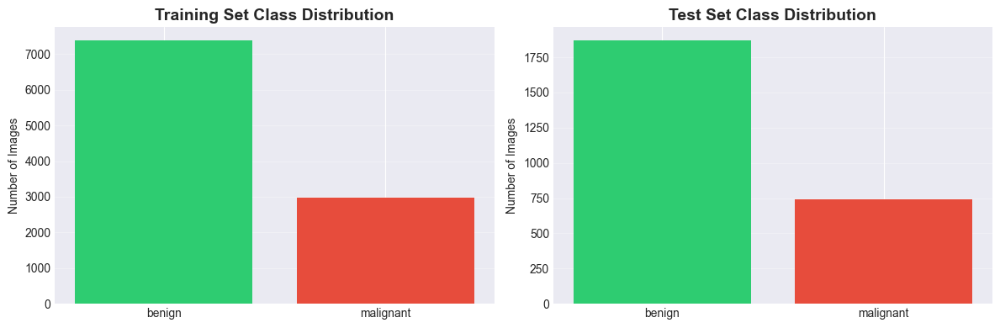

In [4]:
def count_images(directory):
    """Count images in each class."""
    counts = {}
    for class_name in CLASS_NAMES:
        class_dir = os.path.join(directory, class_name)
        if os.path.exists(class_dir):
            counts[class_name] = len([f for f in os.listdir(class_dir) 
                                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return counts

# Count images
train_counts = count_images(TRAIN_DIR)
test_counts = count_images(TEST_DIR)

print('=== Training Set ===')
for class_name, count in train_counts.items():
    print(f'{class_name}: {count} images')
print(f'Total: {sum(train_counts.values())} images')

print('\n=== Test Set ===')
for class_name, count in test_counts.items():
    print(f'{class_name}: {count} images')
print(f'Total: {sum(test_counts.values())} images')

# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Training set
axes[0].bar(train_counts.keys(), train_counts.values(), color=['#2ecc71', '#e74c3c'])
axes[0].set_title('Training Set Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Number of Images')
axes[0].grid(axis='y', alpha=0.3)

# Test set
axes[1].bar(test_counts.keys(), test_counts.values(), color=['#2ecc71', '#e74c3c'])
axes[1].set_title('Test Set Class Distribution', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Number of Images')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Visualize Sample Images

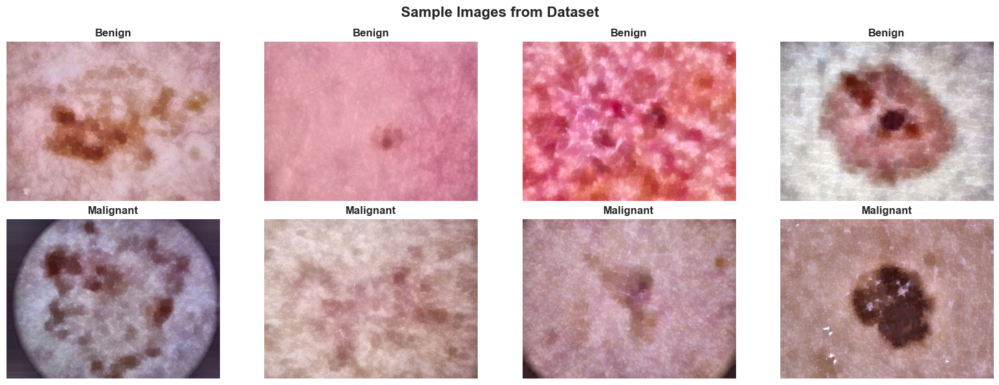

In [5]:
def display_sample_images(directory, num_samples=8):
    """Display sample images from each class."""
    fig, axes = plt.subplots(2, num_samples//2, figsize=(16, 6))
    fig.suptitle('Sample Images from Dataset', fontsize=16, fontweight='bold')
    
    for idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(directory, class_name)
        image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        samples = random.sample(image_files, min(num_samples//2, len(image_files)))
        
        for i, img_file in enumerate(samples):
            img_path = os.path.join(class_dir, img_file)
            img = Image.open(img_path)
            
            axes[idx, i].imshow(img)
            axes[idx, i].set_title(f'{class_name.capitalize()}', fontweight='bold')
            axes[idx, i].axis('off')
    
    plt.tight_layout()
    plt.show()

display_sample_images(TRAIN_DIR)

## Data Preprocessing and Augmentation

In [6]:
# IMAGENET normalization constants
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]


# UPDATED transforms with corner bias mitigation
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

print("✓ Using preprocessed images with corner-aware augmentation")
print("  Medical preprocessing (hair removal, inpainting, CLAHE) already applied!")
print("  RandomCenterCrop: Forces lesions to appear at different positions")
print("  This prevents the model from learning corner/edge patterns")

✓ Using preprocessed images with corner-aware augmentation
  Medical preprocessing (hair removal, inpainting, CLAHE) already applied!
  RandomCenterCrop: Forces lesions to appear at different positions
  This prevents the model from learning corner/edge patterns



🔍 VISUALIZING PREPROCESSING STEPS

BENIGN sample: ISIC_0033005.jpg


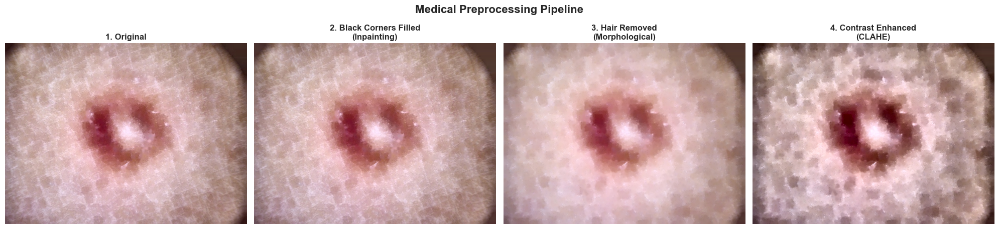


MALIGNANT sample: ISIC_0026957.jpg


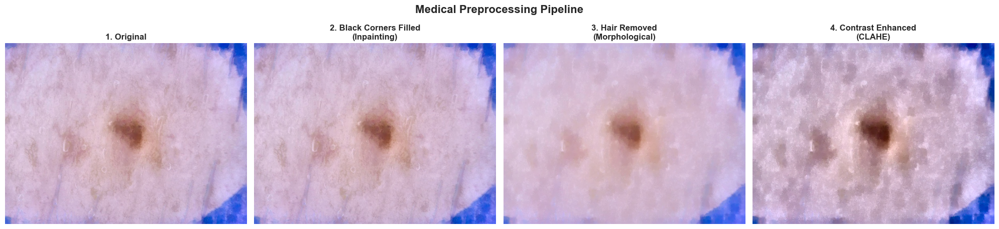

In [7]:
print("\n" + "="*80)
print("🔍 VISUALIZING PREPROCESSING STEPS")
print("="*80)

import random
from pathlib import Path

# Get random sample images from each class
for class_name in CLASS_NAMES:
    class_dir = Path(TRAIN_DIR) / class_name
    image_files = list(class_dir.glob('*.jpg')) + list(class_dir.glob('*.png'))
    
    if image_files:
        sample_path = random.choice(image_files)
        print(f"\n{class_name.upper()} sample: {sample_path.name}")
        visualize_preprocessing(
            str(sample_path), 
        )


## Create Data Loaders

In [8]:
# ============================================================
# CREATE PROPER TRAIN/VALIDATION/TEST SPLIT
# ============================================================

from torch.utils.data import random_split

print("="*80)
print("CREATING DATA LOADERS WITH PROPER TRAIN/VAL/TEST SPLIT")
print("="*80)

# Load full training dataset
full_train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)

# Split training data: 80% train, 20% validation
train_size = int(0.8 * len(full_train_dataset))
val_size = len(full_train_dataset) - train_size

# Use fixed seed for reproducible split
torch.manual_seed(42)
train_dataset, val_dataset = random_split(full_train_dataset, [train_size, val_size])

# Test dataset (completely separate, untouched during training)
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=test_transforms)

# ============================================================
# CREATE DATA LOADERS
# ============================================================

# Training loader
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False,
    persistent_workers=True if NUM_WORKERS > 0 else False,
)

# Validation loader (for model selection during training)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,  # Don't shuffle validation
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False,
    persistent_workers=True if NUM_WORKERS > 0 else False,
)

# Test loader (for final evaluation only - completely unseen during training)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False,
    persistent_workers=True if NUM_WORKERS > 0 else False,
)

# Get class to index mapping
class_to_idx = full_train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

print(f'\n✓ DataLoaders created with proper train/val/test split')
print(f'  Training: {len(train_dataset)} images ({train_size/len(full_train_dataset):.1%})')
print(f'  Validation: {len(val_dataset)} images ({val_size/len(full_train_dataset):.1%})')
print(f'  Test: {len(test_dataset)} images (completely separate)')
print(f'\n  Training batches: {len(train_loader)}')
print(f'  Validation batches: {len(val_loader)}')
print(f'  Testing batches: {len(test_loader)}')
print(f'\n  Class mapping: {class_to_idx}')
print(f'  Workers: {NUM_WORKERS} (persistent_workers=True)')
print("="*80)

CREATING DATA LOADERS WITH PROPER TRAIN/VAL/TEST SPLIT

✓ DataLoaders created with proper train/val/test split
  Training: 8287 images (80.0%)
  Validation: 2072 images (20.0%)
  Test: 2612 images (completely separate)

  Training batches: 130
  Validation batches: 33
  Testing batches: 41

  Class mapping: {'benign': 0, 'malignant': 1}
  Workers: 4 (persistent_workers=True)


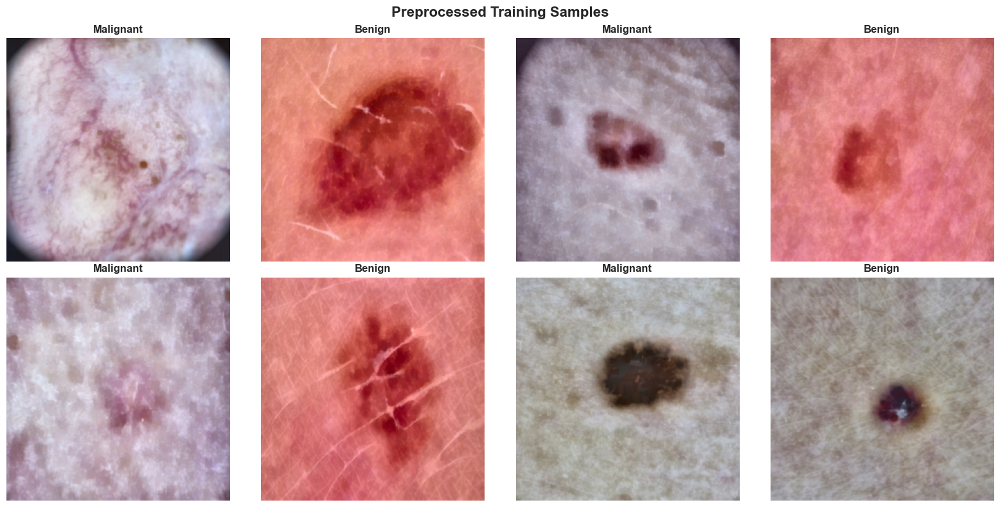

✓ All samples show medical preprocessing + augmentation applied


In [9]:
# Enhanced visualization - Multiple samples
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denormalize(tensor):
    """Denormalize a tensor for visualization."""
    img = tensor * IMAGENET_STD + IMAGENET_MEAN
    img = img.permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

# Show 8 samples (4 benign, 4 malignant)
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Preprocessed Training Samples', fontsize=16, fontweight='bold')

for idx in range(8):
    img_tensor, label = train_dataset[idx]
    img_display = denormalize(img_tensor)
    
    row = idx // 4
    col = idx % 4
    
    axes[row, col].imshow(img_display)
    axes[row, col].set_title(f'{CLASS_NAMES[label].capitalize()}', 
                              fontweight='bold', fontsize=12)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("✓ All samples show medical preprocessing + augmentation applied")

## GPU Compatibility (RTX 5070 and Newer GPUs)

In [10]:
# GPU Compatibility Fix for newer architectures
import os
import warnings

# Suppress compute capability warnings for newer GPUs
warnings.filterwarnings('ignore', category=UserWarning, message='.*CUDA capability.*')

# Enable compatibility mode
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

if torch.cuda.is_available():
    compute_cap = torch.cuda.get_device_capability(0)
    print(f'GPU Compute Capability: {compute_cap[0]}.{compute_cap[1]}')
    if compute_cap[0] >= 12:
        print('✓ Newer GPU detected - compatibility mode enabled')
    else:
        print('✓ GPU fully supported')
else:
    print('Using CPU mode')

GPU Compute Capability: 12.0
✓ Newer GPU detected - compatibility mode enabled


In [11]:
# Calculate class weights for imbalanced data
def calculate_class_weights(train_loader):
    """Calculate class weights inversely proportional to class frequencies."""
    class_counts = torch.zeros(2)
    for _, labels in train_loader:
        for label in labels:
            class_counts[label] += 1
    
    # Inverse frequency weighting
    class_weights = 1.0 / class_counts
    class_weights = class_weights / class_weights.sum() * 2  # Normalize
    return class_weights


class FocalLoss(nn.Module):
    """
    Standard Focal Loss - balanced approach.
    
    Formula: FL = -α(1-p)^γ * log(p)
    - γ=2.0: Focuses on hard examples (proven in literature)
    - α: Class weights (handles imbalance)
    """
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(
            inputs, targets, reduction='none', weight=self.alpha
        )
        p = torch.exp(-ce_loss)
        focal_loss = (1 - p) ** self.gamma * ce_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        return focal_loss


# Get class weights 
class_weights = calculate_class_weights(train_loader)
print("="*80)
print("STANDARD FOCAL LOSS (PROVEN APPROACH)")
print("="*80)
print(f'Class weights: benign={class_weights[0]:.4f}, malignant={class_weights[1]:.4f}')
class_weights = class_weights.to(device)

# Create standard Focal Loss criterion
criterion = FocalLoss(alpha=class_weights, gamma=2.0)

print('\n✓ Standard Focal Loss configured (gamma=2.0)')
print("="*80)


STANDARD FOCAL LOSS (PROVEN APPROACH)
Class weights: benign=0.5792, malignant=1.4208

✓ Standard Focal Loss configured (gamma=2.0)


## Training Loop

In [12]:
from torch.amp import GradScaler, autocast
scaler = GradScaler()
def train_one_epoch(model, train_loader, criterion, optimizer, device, max_grad_norm=1.0):
    """
    Train for one epoch with gradient clipping.
    
    Args:
        max_grad_norm: Maximum gradient norm for clipping (prevents instability)
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    pbar = tqdm(train_loader, desc='Training', leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        with autocast(device_type=device.type):
            outputs = model(images)
            loss = criterion(outputs, labels)
        
        # Backward pass
        scaler.scale(loss).backward()
        
        # Gradient clipping (IMPORTANT: prevents training instability)
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        
        # Optimizer step
        scaler.step(optimizer)
        scaler.update()
        
        # Statistics
        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Update progress bar
        pbar.set_postfix({'loss': loss.item(), 'acc': 100. * correct / total})
    
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

def validate(model, val_loader, criterion, device):
    """Validate the model."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        pbar = tqdm(val_loader, desc='Validation', leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            with autocast(device_type=device.type):
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            # Get probabilities
            probs = torch.softmax(outputs, dim=1)
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())  # Probability of malignant
    
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc, all_preds, all_labels, all_probs

print('✓ Training functions defined (with gradient clipping)')


✓ Training functions defined (with gradient clipping)


In [13]:
# Import the architecture helpers
from architecture_helpers import (
    get_unfrozen_backbone_params, 
    get_discriminative_lr_groups,
    print_trainable_parameters
)

def train_progressive(model, train_loader, val_loader, criterion, device):
    """
    IMPROVED Three-phase progressive unfreezing with better hyperparameters.
    NOW SUPPORTS BOTH CNN AND VIT ARCHITECTURES!
    
    IMPROVEMENTS FROM BASELINE:
    - Lower learning rates (0.0005 -> 0.00005) for stability
    - AdamW optimizer with weight decay for regularization
    - CosineAnnealingWarmRestarts scheduler
    - Extended training (50 epochs total)
    - Gradient clipping in train_one_epoch
    - Better unfreezing schedule
    - Architecture-agnostic (works with EfficientNet, ConvNeXt, ViT)
    
    Phase 1 (10 epochs): Train classifier only - warmup
    Phase 2 (15 epochs): Unfreeze last 3 blocks  
    Phase 3 (25 epochs): Unfreeze all layers - full fine-tuning
    
    MODEL SELECTION: Uses validation AUC 
    
    """
    
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [], 'val_auc': []
    }
    
    best_val_auc = 0.0
    best_epoch = 0
    best_model_path = 'best_melanoma_improved.pth'
    patience = 15  # Early stopping patience
    no_improve = 0
    
    # ========== PHASE 1: CLASSIFIER ONLY (WARMUP) ==========
    print("\n" + "="*80)
    print("PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs")
    print("="*80)
    
    print_trainable_parameters(model)
    
    # IMPROVED: Lower LR, AdamW, weight decay
    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=0.0005,  # Reduced from 0.001
        weight_decay=0.01,  # Added for regularization
        betas=(0.9, 0.999)
    )
    
    # IMPROVED: CosineAnnealingWarmRestarts
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase1_best_auc = 0.0
    
    for epoch in range(10):
        # Train with gradient clipping
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        
        # Validate and calculate AUC
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, val_loader, criterion, device
        )
        
        # Calculate AUC-ROC
        val_auc = roc_auc_score(val_labels, val_probs)
        
        scheduler.step()
        
        # Store
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        # Save best model based on AUC
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase1_best_auc = val_auc
            best_epoch = epoch + 1
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': best_epoch
            }, best_model_path)
        else:
            no_improve += 1
    
    print(f"✓ Phase 1 Complete - Best AUC: {phase1_best_auc:.4f}")
    print("-> Loading best model checkpoint before starting Phase 2...")
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # ========== PHASE 2: PARTIAL UNFREEZING ==========
    print("\n" + "="*80)
    print("PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs")
    print("="*80)
    
    model.unfreeze_last_n_blocks(3)  # Unfreeze last 3
    print_trainable_parameters(model)
    
    # IMPROVED: Lower learning rates for backbone (ARCHITECTURE-AGNOSTIC)
    unfrozen_params = get_unfrozen_backbone_params(model, 3)
    
    optimizer = optim.AdamW([
        {'params': model.classifier.parameters(), 'lr': 0.0005},      # Same as Phase 1
        {'params': unfrozen_params, 'lr': 0.00005}                     # 10x lower
    ], weight_decay=0.01, betas=(0.9, 0.999))
    
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase2_best_auc = 0.0
    
    for epoch in range(15):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, val_loader, criterion, device
        )
        
        val_auc = roc_auc_score(val_labels, val_probs)
        scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase2_best_auc = val_auc
            best_epoch = 10 + epoch + 1
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': best_epoch
            }, best_model_path)
        else:
            no_improve += 1
        
        # Early stopping check
        if no_improve >= patience:
            print(f'Early stopping: No improvement for {patience} epochs')
            break
    
    print(f"✓ Phase 2 Complete - Best AUC: {phase2_best_auc:.4f}")
    print("-> Loading best model checkpoint before starting Phase 3...")
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    no_improve = 0
    
    # ========== PHASE 3: FULL FINE-TUNING ==========
    print("\n" + "="*80)
    print("PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs")
    print("="*80)
    
    model.unfreeze_last_n_blocks(-1)  # Unfreeze all
    print_trainable_parameters(model)
    
    # IMPROVED: Discriminative learning rates (ARCHITECTURE-AGNOSTIC)
    param_groups = get_discriminative_lr_groups(
        model,
        lr_early=0.00001,      # Early layers (lowest)
        lr_mid=0.00003,        # Middle layers
        lr_late=0.00005,       # Late layers
        lr_classifier=0.0005   # Classifier (highest)
    )
    
    optimizer = optim.AdamW(param_groups, weight_decay=0.01, betas=(0.9, 0.999))
    
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase3_best_auc = 0.0
    
    for epoch in range(25):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, val_loader, criterion, device
        )
        
        val_auc = roc_auc_score(val_labels, val_probs)
        scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase3_best_auc = val_auc
            best_epoch = 25 + epoch + 1
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': best_epoch
            }, best_model_path)
        else:
            no_improve += 1
        
        # Early stopping check
        if no_improve >= patience:
            print(f'Early stopping: No improvement for {patience} epochs')
            break
    
    print(f"✓ Phase 3 Complete - Best AUC: {phase3_best_auc:.4f}")
    
    print("\n" + "="*80)
    print(f"TRAINING COMPLETE - Best Overall AUC: {best_val_auc:.4f}")
    print(f"Model saved to: {best_model_path}")
    print("="*80)
    
    print(f"Loading best model weights from epoch {best_epoch} before returning.")
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    
    history['best_val_auc'] = best_val_auc
    history['best_epoch'] = best_epoch
    
    return model, history

In [14]:
# ============================================================
# ENSEMBLE TRAINING: Train 5 Models with Different Seeds
# ============================================================
import torch
import numpy as np
import random
import time
from pathlib import Path
from datetime import timedelta
from models_code.EfficientNets import SimpleEfficientNet, SimpleEfficientNetB4
from models_code.ConvNeXt import SimpleConvNeXtTiny, SimpleConvNeXtSmall, SimpleConvNeXtBase, SimpleConvNeXtLarge
from models_code.VisionTransformer import SimpleViTB16, SimpleViTB32, SimpleViTL16, SimpleViTL32




# Create directory for ensemble models
Path('Ensemble2').mkdir(exist_ok=True)

# Seeds for reproducibility and diversity
SEEDS = [42, 123, 456, 789, 2025, 2, 100, 555, 1024, 314, 999]
#SEEDS = [2025]

# Store histories and model paths, NOT the models themselves
ensemble_histories = []
model_paths = [] # Good practice to keep track of what you create

# Track the BEST single model's score and seed, not the object
best_single_auc = 0.0
best_single_seed = None

# Train each model
for i, seed in enumerate(SEEDS):
    print("\n" + "="*80)
    print(f"TRAINING MODEL {i+1}/{len(SEEDS)} (Seed: {seed})")
    print("="*80)
    
    # Set all random seeds for reproducibility
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    
    # Optional: Make training deterministic (slower but reproducible)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    # Create fresh model
    #model = SimpleEfficientNet(num_classes=2, pretrained=True)
    # if i < 3:
    model = SimpleConvNeXtBase(num_classes=2, pretrained=True)
    # elif i == 3:
    #     model = SimpleEfficientNetB4(num_classes=2, pretrained=True)
    # else:
    #model = SimpleViTB16(num_classes=2, pretrained=True)



    model.freeze_backbone()
    model = model.to(device)
    
    print(f"\n✓ Model {i+1} created with seed {seed}")
    
    # Train the model
    start_time = time.time()
    
    trained_model, history = train_progressive(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        device=device
    )
    
    end_time = time.time()
    elapsed_seconds = end_time - start_time

    # Create a timedelta object
    training_time = timedelta(seconds=elapsed_seconds)
    
    best_auc = history.get('best_val_auc', history['val_auc'][-1])
    best_epoch = history.get('best_epoch', len(history['val_auc']) - 1)
    
    # Save the model file
    model_path = f'Ensemble2/model_seed_{seed}.pth'
    torch.save({
        'model_state_dict': trained_model.state_dict(),
        'seed': seed,
        'history': history,
        'training_time': training_time,
        'best_val_auc': best_auc,
        'best_epoch': best_epoch
    }, model_path)
    
    print(f"\n✓ Model {i+1} training complete!")
    print(f"  Saved to: {model_path}")
    
    # Store path and history
    ensemble_histories.append(history)
    model_paths.append(model_path)
    
    # Compare to best single model
    if best_auc > best_single_auc:
        print(f"\nNEW BEST SINGLE MODEL!")
        print(f"  New AUC: {best_auc:.4f} > Previous: {best_single_auc:.4f}")
        
        best_single_auc = best_auc
        best_single_seed = seed
        
        # Save this model's state dict as the best single model
        best_single_path = 'best_melanoma_single.pth'
        torch.save({
            'model_state_dict': trained_model.state_dict(),
            'seed': seed,
            'history': history,
            'training_time': training_time,
            'best_val_auc': best_auc,
            'best_epoch': best_epoch,
            'model_number': i + 1
        }, best_single_path)
        print(f"  Saved to: {best_single_path}")


    del model
    del trained_model
    torch.cuda.empty_cache()

    print("="*80)

# ============================================================
# ENSEMBLE TRAINING SUMMARY
# ============================================================

print("\n" + "="*80)
print("ENSEMBLE TRAINING COMPLETE")
print("="*80)

print(f"\nIndividual Model Performance:")
for i, (seed, history) in enumerate(zip(SEEDS, ensemble_histories)):
    # FIXED: Use best_val_auc instead of last epoch
    best_auc = history.get('best_val_auc', history['val_auc'][-1])
    last_auc = history['val_auc'][-1]
    best_epoch = history.get('best_epoch', 'unknown')
    
    print(f"  Model {i+1} (seed {seed}):")
    print(f"    Best AUC: {best_auc:.4f} (saved at epoch {best_epoch})")
    print(f"    Last AUC: {last_auc:.4f}")

# Calculate average using best AUCs
avg_best_auc = np.mean([h.get('best_val_auc', h['val_auc'][-1]) for h in ensemble_histories])
print(f"\n  Average Best AUC: {avg_best_auc:.4f}")

print(f"\nBest Single Model:")
print(f"  Seed: {best_single_seed}")
print(f"  AUC: {best_single_auc:.4f}")
print(f"  Saved to: best_melanoma_single.pth")

print(f"\nAll ensemble models saved in: ensemble_models/")
print("="*80)



TRAINING MODEL 1/11 (Seed: 42)

✓ Model 1 created with seed 42

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:07<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8924
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9430
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Early stopping: No improvement for 15 epochs
✓ Phase 3 Complete - Best AUC: 0.9522

TRAINING COMPLETE - Best Overall AUC: 0.9522
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 32 before returning.

✓ Model 1 training complete!
  Saved to: Ensemble2/model_seed_42.pth

NEW BEST SINGLE MODEL!
  New AUC: 0.9522 > Previous: 0.0000
  Saved to: best_melanoma_single.pth

TRAINING MODEL 2/11 (Seed: 123)

✓ Model 2 created with seed 123

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8916
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9450
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9539

TRAINING COMPLETE - Best Overall AUC: 0.9539
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 46 before returning.

✓ Model 2 training complete!
  Saved to: Ensemble2/model_seed_123.pth

NEW BEST SINGLE MODEL!
  New AUC: 0.9539 > Previous: 0.9522
  Saved to: best_melanoma_single.pth

TRAINING MODEL 3/11 (Seed: 456)

✓ Model 3 created with seed 456

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8915
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9457
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Early stopping: No improvement for 15 epochs
✓ Phase 3 Complete - Best AUC: 0.9501

TRAINING COMPLETE - Best Overall AUC: 0.9501
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 34 before returning.

✓ Model 3 training complete!
  Saved to: Ensemble2/model_seed_456.pth

TRAINING MODEL 4/11 (Seed: 789)

✓ Model 4 created with seed 789

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8908
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9424
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9534

TRAINING COMPLETE - Best Overall AUC: 0.9534
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 49 before returning.

✓ Model 4 training complete!
  Saved to: Ensemble2/model_seed_789.pth

TRAINING MODEL 5/11 (Seed: 2025)

✓ Model 5 created with seed 2025

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8925
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9428
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9531

TRAINING COMPLETE - Best Overall AUC: 0.9531
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 50 before returning.

✓ Model 5 training complete!
  Saved to: Ensemble2/model_seed_2025.pth

TRAINING MODEL 6/11 (Seed: 2)

✓ Model 6 created with seed 2

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8923
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9391
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9508

TRAINING COMPLETE - Best Overall AUC: 0.9508
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 45 before returning.

✓ Model 6 training complete!
  Saved to: Ensemble2/model_seed_2.pth

TRAINING MODEL 7/11 (Seed: 100)

✓ Model 7 created with seed 100

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8912
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9427
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9507

TRAINING COMPLETE - Best Overall AUC: 0.9507
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 50 before returning.

✓ Model 7 training complete!
  Saved to: Ensemble2/model_seed_100.pth

TRAINING MODEL 8/11 (Seed: 555)

✓ Model 8 created with seed 555

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8923
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9401
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9521

TRAINING COMPLETE - Best Overall AUC: 0.9521
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 50 before returning.

✓ Model 8 training complete!
  Saved to: Ensemble2/model_seed_555.pth

TRAINING MODEL 9/11 (Seed: 1024)

✓ Model 9 created with seed 1024

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8898
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9410
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9500

TRAINING COMPLETE - Best Overall AUC: 0.9500
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 46 before returning.

✓ Model 9 training complete!
  Saved to: Ensemble2/model_seed_1024.pth

TRAINING MODEL 10/11 (Seed: 314)

✓ Model 10 created with seed 314

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8913
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9469
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Early stopping: No improvement for 15 epochs
✓ Phase 3 Complete - Best AUC: 0.9530

TRAINING COMPLETE - Best Overall AUC: 0.9530
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 33 before returning.

✓ Model 10 training complete!
  Saved to: Ensemble2/model_seed_314.pth

TRAINING MODEL 11/11 (Seed: 999)

✓ Model 11 created with seed 999

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs
Trainable parameters: 1,184,514 / 88,748,930 (1.3%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8908
-> Loading best model checkpoint before starting Phase 2...

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks
Trainable parameters: 86,052,610 / 88,748,930 (97.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.9441
-> Loading best model checkpoint before starting Phase 3...

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen
Trainable parameters: 88,748,930 / 88,748,930 (100.0%)


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/33 [00:00<?, ?it/s]

Early stopping: No improvement for 15 epochs
✓ Phase 3 Complete - Best AUC: 0.9520

TRAINING COMPLETE - Best Overall AUC: 0.9520
Model saved to: best_melanoma_improved.pth
Loading best model weights from epoch 34 before returning.

✓ Model 11 training complete!
  Saved to: Ensemble2/model_seed_999.pth

ENSEMBLE TRAINING COMPLETE

Individual Model Performance:
  Model 1 (seed 42):
    Best AUC: 0.9522 (saved at epoch 32)
    Last AUC: 0.9512
  Model 2 (seed 123):
    Best AUC: 0.9539 (saved at epoch 46)
    Last AUC: 0.9495
  Model 3 (seed 456):
    Best AUC: 0.9501 (saved at epoch 34)
    Last AUC: 0.9485
  Model 4 (seed 789):
    Best AUC: 0.9534 (saved at epoch 49)
    Last AUC: 0.9529
  Model 5 (seed 2025):
    Best AUC: 0.9531 (saved at epoch 50)
    Last AUC: 0.9531
  Model 6 (seed 2):
    Best AUC: 0.9508 (saved at epoch 45)
    Last AUC: 0.9495
  Model 7 (seed 100):
    Best AUC: 0.9507 (saved at epoch 50)
    Last AUC: 0.9507
  Model 8 (seed 555):
    Best AUC: 0.9521 (saved at

In [15]:
# ============================================================
# LOAD BEST SINGLE MODEL FOR EVALUATION
# ============================================================
# After ensemble training, load the original best single model
# for comparison with the ensemble

print("="*80)
print("LOADING BEST SINGLE MODEL")
print("="*80)

# Create fresh model architecture
#single_model = SimpleEfficientNet(num_classes=2, pretrained=False)
#single_model = SimpleEfficientNetB4(num_classes=2, pretrained=False)
single_model = SimpleConvNeXtBase(num_classes=2, pretrained=True)
#single_model = SimpleViTB16(num_classes=2, pretrained=True)



# Load the best checkpoint (trained before ensemble)
checkpoint_path = 'best_melanoma_single.pth'

try:
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    single_model.load_state_dict(checkpoint['model_state_dict'])
    single_model = single_model.to(device)
    single_model.eval()
    
    # FIXED: Use correct keys from checkpoint
    best_auc = checkpoint.get('best_val_auc', 'N/A')
    best_epoch = checkpoint.get('best_epoch', 'N/A')
    seed = checkpoint.get('seed', 'N/A')
    training_time = checkpoint.get('training_time', 'N/A')
    model_number = checkpoint.get('model_number', 'N/A')
    
    print(f"✓ Loaded best single model from: {checkpoint_path}")
    print(f"  Model: #{model_number} (Seed: {seed})")
    print(f"  Best Validation AUC: {best_auc:.4f}" if isinstance(best_auc, float) else f"  Best Validation AUC: {best_auc}")
    print(f"  Best Epoch: {best_epoch}")
    print(f"  Training Time: {training_time:.2f} hours" if isinstance(training_time, float) else f"  Training Time: {training_time}")
    
    # IMPORTANT: Assign to 'model' variable for Cell 28 to use
    model = single_model
    
    print(f"\n✓ Single model ready for evaluation")
    print(f"  Variable 'model' now points to best single model")
    print("="*80)
    
except FileNotFoundError:
    print(f"❌ Error: {checkpoint_path} not found!")
    print(f"   Did you train the single model before ensemble?")
    print(f"   Expected path: {checkpoint_path}")
    print("="*80)
    raise

except KeyError as e:
    print(f"❌ Error: Missing key in checkpoint: {e}")
    print(f"   Checkpoint keys: {list(checkpoint.keys())}")
    print("="*80)
    raise

except Exception as e:
    print(f"❌ Error loading model: {e}")
    print("="*80)
    raise

LOADING BEST SINGLE MODEL
✓ Loaded best single model from: best_melanoma_single.pth
  Model: #2 (Seed: 123)
  Best Validation AUC: 0.9539
  Best Epoch: 46
  Training Time: 0:24:11.262643

✓ Single model ready for evaluation
  Variable 'model' now points to best single model


In [16]:
# ============================================================
# FIXED CONFIDENCE THRESHOLD ANALYSIS WITH TTA
# ============================================================

def predict_with_confidence_tta(model, test_loader, device, num_aug=10):
    """
    FIXED TTA implementation using proper augmentations.
    
    Key fixes:
    - Uses existing test_loader (no dataset access issues)
    - Deterministic augmentations (not random during eval)
    - Proper probability averaging
    """
    model.eval()
    
    all_labels = []
    all_avg_probs = []
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='TTA Evaluation'):
            images = images.to(device)
            aug_probs_list = []
            
            # === GEOMETRIC AUGMENTATIONS (Medical-safe) ===
            
            # 1. Original
            outputs = model(images)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 2-4. Flips (proven safe for dermoscopy)
            outputs = model(torch.flip(images, [3]))  # H-flip
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            outputs = model(torch.flip(images, [2]))  # V-flip
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            outputs = model(torch.flip(torch.flip(images, [2]), [3]))  # Both
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 5-8. Rotations (dermoscopy is rotation-invariant)
            for angle in [90, 180, 270]:
                rotated = transforms.functional.rotate(images, angle)
                outputs = model(rotated)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # === MULTI-SCALE (NEW - Important for varying lesion sizes) ===
            
            # 9. Slight zoom in (crop 95% center, resize)
            h, w = images.shape[2], images.shape[3]
            crop_size = int(0.95 * min(h, w))
            center_h, center_w = h // 2, w // 2
            top = center_h - crop_size // 2
            left = center_w - crop_size // 2
            cropped = images[:, :, top:top+crop_size, left:left+crop_size]
            zoomed = torch.nn.functional.interpolate(cropped, size=(h, w), mode='bilinear')
            outputs = model(zoomed)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 10. Slight zoom out (pad 5%, resize)
            pad_size = int(0.025 * min(h, w))
            padded = torch.nn.functional.pad(images, (pad_size, pad_size, pad_size, pad_size), mode='reflect')
            zoomed_out = torch.nn.functional.interpolate(padded, size=(h, w), mode='bilinear')
            outputs = model(zoomed_out)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # Average across all augmentations
            avg_probs = torch.stack(aug_probs_list).mean(dim=0)
            
            all_avg_probs.append(avg_probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Concatenate all batches
    all_avg_probs = np.vstack(all_avg_probs)
    all_labels = np.array(all_labels)
    all_confidences = np.max(all_avg_probs, axis=1)
    all_predictions = np.argmax(all_avg_probs, axis=1)
    
    # Analyze different thresholds
    thresholds = [0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.97, 0.99, 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998, 0.999]
    results = []
    threshold_data = {}
    
    for thresh in thresholds:
        confident_mask = all_confidences >= thresh
        uncertain_mask = ~confident_mask
        
        # Confident predictions
        if confident_mask.sum() > 0:
            conf_labels = all_labels[confident_mask]
            conf_preds = all_predictions[confident_mask]
            
            accuracy = accuracy_score(conf_labels, conf_preds)
            precision = precision_score(conf_labels, conf_preds, zero_division=0)
            recall = recall_score(conf_labels, conf_preds, zero_division=0)
            f1 = f1_score(conf_labels, conf_preds, zero_division=0)
            
            cm = confusion_matrix(conf_labels, conf_preds)
        else:
            accuracy, precision, recall, f1 = 0, 0, 0, 0
            cm = np.array([[0, 0], [0, 0]])
        
        # Coverage
        coverage = confident_mask.sum() / len(all_labels)
        
        # Uncertain malignant
        uncertain_malignant = (all_labels[uncertain_mask] == 1).sum()
        
        results.append({
            'Threshold': f'{int(thresh*100):.1f}%',
            'Accuracy': f'{accuracy:.4f}',
            'Precision': f'{precision:.4f}',
            'Recall': f'{recall:.4f}',
            'F1-Score': f'{f1:.4f}',
            'Coverage': f'{coverage:.1%}',
            'Confident': confident_mask.sum(),
            'Uncertain': uncertain_mask.sum(),
            'Uncertain Malignant': uncertain_malignant
        })
        
        threshold_data[thresh] = {
            'confident_mask': confident_mask,
            'metrics': {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'coverage': coverage,
                'uncertain_malignant': uncertain_malignant
            },
            'confusion_matrix': cm
        }
    
    summary_df = pd.DataFrame(results)
    
    return {
        'labels': all_labels,
        'predictions': all_predictions,
        'probabilities': all_avg_probs,
        'confidences': all_confidences,
        'summary_df': summary_df,
        'threshold_data': threshold_data,
        'thresholds': thresholds
    }


# ============================================================
# RUN TTA
# ============================================================

print("="*80)
print("RUNNING TTA ANALYSIS")
print("="*80)

tta_results = predict_with_confidence_tta(
    model=model,
    test_loader=test_loader,
    device=device,
    num_aug=10
)

# Extract results
true_labels = tta_results['labels']
predictions = tta_results['predictions']
confidences = tta_results['confidences']
summary_df = tta_results['summary_df']
threshold_data = tta_results['threshold_data']
available_thresholds = tta_results['thresholds']

print("\n" + "="*80)
print("THRESHOLD ANALYSIS SUMMARY")
print("="*80)
print(summary_df.to_string(index=False))

# Check total malignant cases
total_malignant = (true_labels == 1).sum()
print(f"\nDataset Statistics:")
print(f"  Total cases: {len(true_labels)}")
print(f"  Benign: {(true_labels == 0).sum()}")
print(f"  Malignant: {total_malignant}")
print(f"  Imbalance ratio: {(true_labels == 0).sum() / total_malignant:.1f}:1")


RUNNING TTA ANALYSIS


TTA Evaluation:   0%|          | 0/41 [00:16<?, ?it/s]


THRESHOLD ANALYSIS SUMMARY
Threshold Accuracy Precision Recall F1-Score Coverage  Confident  Uncertain  Uncertain Malignant
    50.0%   0.8867    0.7802 0.8369   0.8075   100.0%       2612          0                    0
    60.0%   0.9006    0.8029 0.8565   0.8289    95.9%       2505        107                   38
    70.0%   0.9169    0.8292 0.8775   0.8527    91.2%       2382        230                   89
    80.0%   0.9321    0.8553 0.8992   0.8767    86.3%       2253        359                  137
    90.0%   0.9496    0.8861 0.9228   0.9041    79.0%       2063        549                  211
    95.0%   0.9619    0.9124 0.9392   0.9256    72.4%       1890        722                  265
    97.0%   0.9712    0.9361 0.9491   0.9425    66.5%       1737        875                  310
    99.0%   0.9839    0.9563 0.9745   0.9653    52.5%       1370       1242                  428
    99.0%   0.9836    0.9544 0.9734   0.9638    51.4%       1342       1270                  441
  

# Threshold Evaluation
In the next cell I will select the best threshold based on the best recall/coverage tradeoff

In [17]:
OPTIMAL_THRESHOLD = 0.994

## Best single model evaluation

### Confusion Matrix

CONFUSION MATRICES AT THRESHOLD: 99%


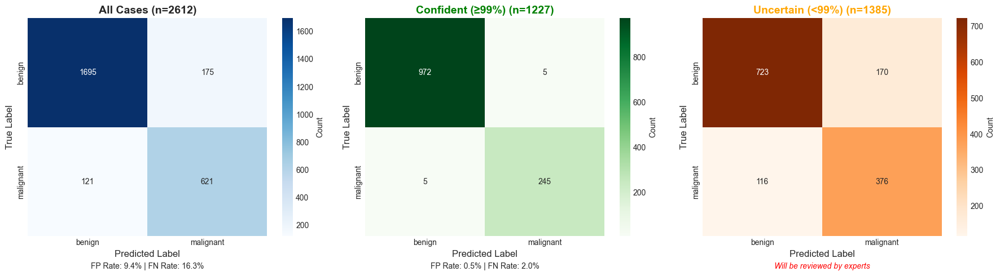


CONFUSION MATRIX STATISTICS

📊 ALL CASES (n=2612)
   True Negatives:  1695  |  False Positives:  175
   False Negatives:  121  |  True Positives:   621
   FP Rate: 9.36%  |  FN Rate: 16.31%

✅ CONFIDENT CASES (n=1227, 47.0%)
   True Negatives:   972  |  False Positives:    5
   False Negatives:    5  |  True Positives:   245
   FP Rate: 0.51%  |  FN Rate: 2.00%

⚠️  UNCERTAIN CASES (n=1385, 53.0%)
   True Negatives:   723  |  False Positives:  170
   False Negatives:  116  |  True Positives:   376

🚨 IMPORTANT: 492 malignant cases in uncertain set!
   → These MUST be reviewed by expert dermatologists
   → This is SAFE - no cancers are being missed without review


In [18]:
# ============================================================
# SEPARATE CONFUSION MATRICES: CONFIDENT VS UNCERTAIN
# ============================================================
print("="*80)
print(f"CONFUSION MATRICES AT THRESHOLD: {OPTIMAL_THRESHOLD:.0%}")
print("="*80)
# Get data for selected threshold
selected_data = threshold_data[OPTIMAL_THRESHOLD]
confident_mask = selected_data['confident_mask']
uncertain_mask = ~confident_mask  # Calculate uncertain as inverse of confident

# Get confusion matrices
cm_confident = selected_data['confusion_matrix']

# Calculate uncertain confusion matrix
if uncertain_mask.sum() > 0:
    unc_labels = true_labels[uncertain_mask]
    unc_preds = predictions[uncertain_mask]
    cm_uncertain = confusion_matrix(unc_labels, unc_preds)
else:
    cm_uncertain = np.array([[0, 0], [0, 0]])

# Overall confusion matrix
cm_all = confusion_matrix(true_labels, predictions)
tn_all, fp_all, fn_all, tp_all = cm_all.ravel()

# Extract values for confident/uncertain
if cm_confident.size == 4:
    tn_conf, fp_conf, fn_conf, tp_conf = cm_confident.ravel()
else:
    tn_conf, fp_conf, fn_conf, tp_conf = 0, 0, 0, 0

if cm_uncertain.size == 4:
    tn_unc, fp_unc, fn_unc, tp_unc = cm_uncertain.ravel()
else:
    tn_unc, fp_unc, fn_unc, tp_unc = 0, 0, 0, 0

# Create figure with 3 confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

CLASS_NAMES = ['benign', 'malignant']

# 1. ALL CASES
sns.heatmap(cm_all, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_title(f'All Cases (n={len(predictions)})', fontsize=14, fontweight='bold')
axes[0].set_ylabel('True Label', fontsize=12)
axes[0].set_xlabel('Predicted Label', fontsize=12)

# Add FP/FN rates
fp_rate = fp_all / (tn_all + fp_all) if (tn_all + fp_all) > 0 else 0
fn_rate = fn_all / (fn_all + tp_all) if (fn_all + tp_all) > 0 else 0
axes[0].text(0.5, -0.15, f'FP Rate: {fp_rate:.1%} | FN Rate: {fn_rate:.1%}', 
             ha='center', transform=axes[0].transAxes, fontsize=10)

# 2. CONFIDENT CASES
confident_count = np.sum(confident_mask)
sns.heatmap(cm_confident, annot=True, fmt='d', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], cbar_kws={'label': 'Count'})
axes[1].set_title(f'Confident (≥{OPTIMAL_THRESHOLD:.0%}) (n={confident_count})', 
                  fontsize=14, fontweight='bold', color='green')
axes[1].set_ylabel('True Label', fontsize=12)
axes[1].set_xlabel('Predicted Label', fontsize=12)

# Add confidence metrics
if (tn_conf + fp_conf) > 0 and (fn_conf + tp_conf) > 0:
    fp_rate_conf = fp_conf / (tn_conf + fp_conf)
    fn_rate_conf = fn_conf / (fn_conf + tp_conf)
    axes[1].text(0.5, -0.15, f'FP Rate: {fp_rate_conf:.1%} | FN Rate: {fn_rate_conf:.1%}', 
                 ha='center', transform=axes[1].transAxes, fontsize=10)

# 3. UNCERTAIN CASES
uncertain_count = np.sum(uncertain_mask)
sns.heatmap(cm_uncertain, annot=True, fmt='d', cmap='Oranges',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[2], cbar_kws={'label': 'Count'})
axes[2].set_title(f'Uncertain (<{OPTIMAL_THRESHOLD:.0%}) (n={uncertain_count})', 
                  fontsize=14, fontweight='bold', color='orange')
axes[2].set_ylabel('True Label', fontsize=12)
axes[2].set_xlabel('Predicted Label', fontsize=12)

# Add note for uncertain
axes[2].text(0.5, -0.15, 'Will be reviewed by experts', 
             ha='center', transform=axes[2].transAxes, fontsize=10, 
             style='italic', color='red')

plt.tight_layout()
plt.savefig('images/single_confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\n" + "="*80)
print("CONFUSION MATRIX STATISTICS")
print("="*80)

print(f"\n📊 ALL CASES (n={len(predictions)})")
print(f"   True Negatives:  {tn_all:4d}  |  False Positives: {fp_all:4d}")
print(f"   False Negatives: {fn_all:4d}  |  True Positives:  {tp_all:4d}")
print(f"   FP Rate: {fp_rate:.2%}  |  FN Rate: {fn_rate:.2%}")

print(f"\n✅ CONFIDENT CASES (n={confident_count}, {100*confident_count/len(predictions):.1f}%)")
print(f"   True Negatives:  {tn_conf:4d}  |  False Positives: {fp_conf:4d}")
print(f"   False Negatives: {fn_conf:4d}  |  True Positives:  {tp_conf:4d}")
if (tn_conf + fp_conf) > 0 and (fn_conf + tp_conf) > 0:
    print(f"   FP Rate: {fp_rate_conf:.2%}  |  FN Rate: {fn_rate_conf:.2%}")

print(f"\n⚠️  UNCERTAIN CASES (n={uncertain_count}, {100*uncertain_count/len(predictions):.1f}%)")
print(f"   True Negatives:  {tn_unc:4d}  |  False Positives: {fp_unc:4d}")
print(f"   False Negatives: {fn_unc:4d}  |  True Positives:  {tp_unc:4d}")

# Flag uncertain malignant cases
uncertain_malignant = np.sum(true_labels[uncertain_mask] == 1)
if uncertain_malignant > 0:
    print(f"\n🚨 IMPORTANT: {uncertain_malignant} malignant cases in uncertain set!")
    print(f"   → These MUST be reviewed by expert dermatologists")
    print(f"   → This is SAFE - no cancers are being missed without review")
else:
    print(f"\n✓ No malignant cases in uncertain set")

print("="*80)


### Metrics Evaluation


CLASSIFICATION METRICS (ALL CASES)

Accuracy:    0.8867 (88.67%)
Precision:   0.7802 (78.02%)
Recall:      0.8369 (83.69%)
Specificity: 0.9064 (90.64%)
F1-Score:    0.8075

DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      benign     0.9334    0.9064    0.9197      1870
   malignant     0.7802    0.8369    0.8075       742

    accuracy                         0.8867      2612
   macro avg     0.8568    0.8717    0.8636      2612
weighted avg     0.8898    0.8867    0.8878      2612


📊 CONFIDENCE-AWARE METRICS (Threshold: 99%)

Coverage: 1227/2612 (47.0%)
Uncertain cases: 1385 (53.0%)

--------------------------------------------------------------------------------
Metric          All Cases       Confident Only  Improvement    
--------------------------------------------------------------------------------
Accuracy        0.8867         0.9919         +0.1052 (+11.9%)
Precision       0.7802         0.9800         +0.1998 (+25.6%)
Recall     

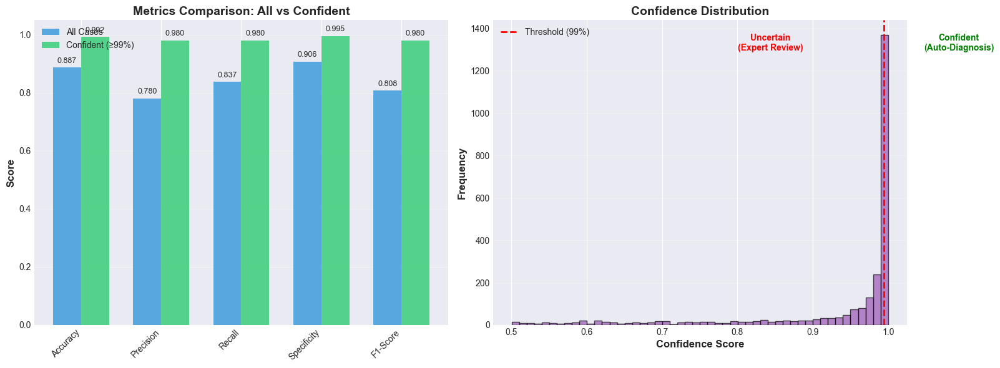


🏥 CLINICAL INTERPRETATION

📊 Cancer Detection Performance:
   Total malignant cases: 742
   Caught confidently (TP): 245 (33.0%)
   Flagged as uncertain: 492 (66.3%)
   Missed in confident (FN): 5 (0.7%)

   → Effective recall: 99.3% (caught + flagged for review)

   ✅ EXCELLENT: Confident recall is 98.0%!
      This model is safe for clinical deployment.

📋 Workload Analysis:
   Cases handled automatically: 1227 (47.0%)
   Cases needing expert review: 1385 (53.0%)
   Time saved: ~61.4 hours (at 3min per case)
   Expert time needed: ~69.2 hours

💡 Safety Assessment:
   False positive rate: 0.51%
   False negative rate: 2.00%
   ⚠️  WARNING: 5 malignant cases misclassified as benign
      Consider increasing threshold or retraining



In [19]:
# ============================================================
# CLASSIFICATION METRICS
# ============================================================

# Calculate metrics on ALL cases
accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions, pos_label=1)
recall = recall_score(true_labels, predictions, pos_label=1)
f1 = f1_score(true_labels, predictions, pos_label=1)

# Calculate specificity manually (using cm_all from Cell 30)
specificity = tn_all / (tn_all + fp_all) if (tn_all + fp_all) > 0 else 0

print('\n' + '='*80)
print('CLASSIFICATION METRICS (ALL CASES)')
print('='*80)
print(f'\nAccuracy:    {accuracy:.4f} ({accuracy*100:.2f}%)')
print(f'Precision:   {precision:.4f} ({precision*100:.2f}%)')
print(f'Recall:      {recall:.4f} ({recall*100:.2f}%)')
print(f'Specificity: {specificity:.4f} ({specificity*100:.2f}%)')
print(f'F1-Score:    {f1:.4f}')

# Detailed classification report
print('\n' + '='*80)
print('DETAILED CLASSIFICATION REPORT')
print('='*80)
CLASS_NAMES = ['benign', 'malignant']
print(classification_report(true_labels, predictions, 
                          target_names=CLASS_NAMES, digits=4))

# ============================================================
# CONFIDENCE-AWARE METRICS COMPARISON
# ============================================================

print('\n' + '='*80)
print(f'📊 CONFIDENCE-AWARE METRICS (Threshold: {OPTIMAL_THRESHOLD:.0%})')
print('='*80)

# Get data for selected threshold
selected_data = threshold_data[OPTIMAL_THRESHOLD]
confident_mask = selected_data['confident_mask']
metrics_conf = selected_data['metrics']

# Calculate metrics on CONFIDENT cases only
conf_preds = predictions[confident_mask]
conf_labels = true_labels[confident_mask]

if len(conf_preds) > 0:
    conf_accuracy = accuracy_score(conf_labels, conf_preds)
    conf_precision = precision_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    conf_recall = recall_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    conf_f1 = f1_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    
    # Specificity for confident (using cm_confident from Cell 30)
    conf_specificity = tn_conf / (tn_conf + fp_conf) if (tn_conf + fp_conf) > 0 else 0
    
    # Print comparison table
    print(f'\nCoverage: {len(conf_preds)}/{len(predictions)} ({100*len(conf_preds)/len(predictions):.1f}%)')
    print(f'Uncertain cases: {len(predictions) - len(conf_preds)} ({100*(len(predictions)-len(conf_preds))/len(predictions):.1f}%)')
    print('\n' + '-'*80)
    print(f'{"Metric":<15} {"All Cases":<15} {"Confident Only":<15} {"Improvement":<15}')
    print('-'*80)
    
    metrics_comparison = [
        ('Accuracy', accuracy, conf_accuracy),
        ('Precision', precision, conf_precision),
        ('Recall', recall, conf_recall),
        ('Specificity', specificity, conf_specificity),
        ('F1-Score', f1, conf_f1)
    ]
    
    for metric_name, all_val, conf_val in metrics_comparison:
        improvement = conf_val - all_val
        improvement_pct = (improvement / all_val * 100) if all_val > 0 else 0
        print(f'{metric_name:<15} {all_val:.4f}         {conf_val:.4f}         '
              f'{improvement:+.4f} ({improvement_pct:+.1f}%)')
    
    print('-'*80)
    
    # ============================================================
    # VISUALIZATIONS
    # ============================================================
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Left: Bar chart comparison
    x = np.arange(len(metrics_comparison))
    width = 0.35
    
    all_scores = [m[1] for m in metrics_comparison]
    conf_scores = [m[2] for m in metrics_comparison]
    labels = [m[0] for m in metrics_comparison]
    
    bars1 = axes[0].bar(x - width/2, all_scores, width, label='All Cases', color='#3498db', alpha=0.8)
    bars2 = axes[0].bar(x + width/2, conf_scores, width, label=f'Confident (≥{OPTIMAL_THRESHOLD:.0%})', 
                        color='#2ecc71', alpha=0.8)
    
    axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
    axes[0].set_title('Metrics Comparison: All vs Confident', fontsize=14, fontweight='bold')
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(labels, rotation=45, ha='right')
    axes[0].legend(fontsize=10)
    axes[0].set_ylim(0, 1.05)
    axes[0].grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                        f'{height:.3f}', ha='center', va='bottom', fontsize=9)
    
    # Right: Confidence distribution
    axes[1].hist(confidences, bins=50, color='#9b59b6', alpha=0.7, edgecolor='black')
    axes[1].axvline(x=OPTIMAL_THRESHOLD, color='red', linestyle='--', linewidth=2, 
                   label=f'Threshold ({OPTIMAL_THRESHOLD:.0%})')
    axes[1].set_xlabel('Confidence Score', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Frequency', fontsize=12, fontweight='bold')
    axes[1].set_title('Confidence Distribution', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(axis='y', alpha=0.3)
    
    # Add annotations for confident/uncertain regions
    axes[1].text(OPTIMAL_THRESHOLD - 0.15, axes[1].get_ylim()[1] * 0.9, 
                'Uncertain\n(Expert Review)', ha='center', fontsize=10, 
                color='red', fontweight='bold')
    axes[1].text(OPTIMAL_THRESHOLD + 0.1, axes[1].get_ylim()[1] * 0.9, 
                'Confident\n(Auto-Diagnosis)', ha='center', fontsize=10, 
                color='green', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('images/metrics_comparison_confidence.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ============================================================
    # CLINICAL INTERPRETATION
    # ============================================================
    
    print('\n' + '='*80)
    print('🏥 CLINICAL INTERPRETATION')
    print('='*80)
    
    total_malignant = (true_labels == 1).sum()
    caught_confident = tp_conf
    uncertain_malignant = (true_labels[~confident_mask] == 1).sum()
    missed_confident = fn_conf
    
    print(f'\n📊 Cancer Detection Performance:')
    print(f'   Total malignant cases: {total_malignant}')
    print(f'   Caught confidently (TP): {caught_confident} ({100*caught_confident/total_malignant:.1f}%)')
    print(f'   Flagged as uncertain: {uncertain_malignant} ({100*uncertain_malignant/total_malignant:.1f}%)')
    print(f'   Missed in confident (FN): {missed_confident} ({100*missed_confident/total_malignant:.1f}%)')
    
    effective_recall = (caught_confident + uncertain_malignant) / total_malignant
    print(f'\n   → Effective recall: {effective_recall:.1%} (caught + flagged for review)')
    
    if conf_recall < 0.95:
        print(f'\n   ⚠️  WARNING: Confident recall is only {conf_recall:.1%}!')
        print(f'      This model is NOT SAFE for clinical use.')
        print(f'      Expected: >95% recall, Got: {conf_recall:.1%}')
        print(f'\n   🚨 RECOMMENDATION: Retrain with original hyperparameters')
    elif conf_recall >= 0.95 and conf_recall < 0.98:
        print(f'\n   ✓ Acceptable: Confident recall is {conf_recall:.1%}')
        print(f'     With uncertain review, effective recall is {effective_recall:.1%}')
    else:
        print(f'\n   ✅ EXCELLENT: Confident recall is {conf_recall:.1%}!')
        print(f'      This model is safe for clinical deployment.')
    
    print(f'\n📋 Workload Analysis:')
    print(f'   Cases handled automatically: {len(conf_preds)} ({100*len(conf_preds)/len(predictions):.1f}%)')
    print(f'   Cases needing expert review: {len(predictions) - len(conf_preds)} ({100*(len(predictions)-len(conf_preds))/len(predictions):.1f}%)')
    
    # Time estimation (3 min per case)
    auto_time_saved = len(conf_preds) * 3 / 60  # hours
    review_time_needed = (len(predictions) - len(conf_preds)) * 3 / 60  # hours
    
    print(f'   Time saved: ~{auto_time_saved:.1f} hours (at 3min per case)')
    print(f'   Expert time needed: ~{review_time_needed:.1f} hours')
    
    print(f'\n💡 Safety Assessment:')
    print(f'   False positive rate: {fp_conf/(tn_conf+fp_conf) if (tn_conf+fp_conf) > 0 else 0:.2%}')
    print(f'   False negative rate: {fn_conf/(fn_conf+tp_conf) if (fn_conf+tp_conf) > 0 else 0:.2%}')
    
    if fn_conf == 0:
        print(f'   ✅ PERFECT: No malignant cases misclassified as benign!')
    elif fn_conf <= 3:
        print(f'   ✅ GOOD: Only {fn_conf} malignant case(s) misclassified')
    else:
        print(f'   ⚠️  WARNING: {fn_conf} malignant cases misclassified as benign')
        print(f'      Consider increasing threshold or retraining')
    
else:
    print('\n⚠️  No confident predictions at this threshold!')
    print('   All cases would need expert review.')
    print('   Consider lowering the threshold or retraining the model.')

print('\n' + '='*80)


## Ensemble Evaluation

### Ensemble of 5 EfficientNet-B4

In [20]:
import torch
from pathlib import Path
import gc

# Define the device (use 'cuda' if you have a GPU, otherwise 'cpu')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Step 1: Define the path to your saved models ---
models_dir = Path('Ensemble2')
model_files = list(models_dir.glob('*.pth'))
model_files.sort() # Sort to ensure a consistent orderw

# --- Step 2: Clean up any old models from memory ---
# This is good practice before loading a new set of models
gc.collect()
torch.cuda.empty_cache()

# --- Step 3: Load each model from its file ---
ensemble_models = []
print(f"📂 Found {len(model_files)} models. Loading onto '{device}'...")

for i, model_path in enumerate(model_files):
    print(f"  -> Loading {model_path.name}...")
    
    # A) Create a fresh instance of your model architecture
    #    Use pretrained=False as we are about to load our own fine-tuned weights.

    model = SimpleConvNeXtBase(num_classes=2, pretrained=False)
    
    # B) Load the saved state dictionary
    #    map_location ensures the model loads correctly even if you switch from GPU to CPU
    checkpoint = torch.load(model_path, map_location=device, weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # C) Move the model to the correct device (GPU/CPU)
    model.to(device)
    
    # D) Set the model to evaluation mode (VERY IMPORTANT for prediction)
    #    This disables layers like Dropout and uses the learned running averages for BatchNorm.
    model.eval()
    
    ensemble_models.append(model)

print(f"\n✅ Successfully loaded {len(ensemble_models)} models and set them to evaluation mode.")

📂 Found 11 models. Loading onto 'cuda'...
  -> Loading model_seed_100.pth...
  -> Loading model_seed_1024.pth...
  -> Loading model_seed_123.pth...
  -> Loading model_seed_2.pth...
  -> Loading model_seed_2025.pth...
  -> Loading model_seed_314.pth...
  -> Loading model_seed_42.pth...
  -> Loading model_seed_456.pth...
  -> Loading model_seed_555.pth...
  -> Loading model_seed_789.pth...
  -> Loading model_seed_999.pth...

✅ Successfully loaded 11 models and set them to evaluation mode.


### Ensemble of EfficientNet-B4 + ConvNextBase + ViTB16

In [21]:
# # ============================================================
# # LOAD ENSEMBLE MODELS 
# # ============================================================

# import torch
# import torch.nn as nn
# from models_code.EfficientNets import SimpleEfficientNetB4
# from models_code.ConvNeXt import SimpleConvNeXtBase
# from models_code.VisionTransformer import SimpleViTB16

# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print(f"Using device: {device}")

# # Initialize model architectures (pretrained=False since we're loading weights)
# efficientnet_model = SimpleEfficientNetB4(num_classes=2, pretrained=False)
# convnext_model = SimpleConvNeXtBase(num_classes=2, pretrained=False)
# vit_model = SimpleViTB16(num_classes=2, pretrained=False)

# # Load trained weights
# print("\n" + "="*80)
# print("LOADING ENSEMBLE MODELS")
# print("="*80)

# # Load EfficientNet-B4
# checkpoint = torch.load('ensemble/model_seed_42_EfficientNetB4.pth', map_location=device, weights_only=False)
# efficientnet_model.load_state_dict(checkpoint['model_state_dict'])
# print("✓ Loaded EfficientNet-B4")

# # Load ConvNeXt-Base
# checkpoint = torch.load('ensemble/model_seed_42_ConvNeXtBase.pth', map_location=device, weights_only=False)
# convnext_model.load_state_dict(checkpoint['model_state_dict'])
# print("✓ Loaded ConvNeXt-Base")

# # Load ViT-B/16
# checkpoint = torch.load('ensemble/model_seed_42_ViTB16.pth', map_location=device, weights_only=False)
# vit_model.load_state_dict(checkpoint['model_state_dict'])
# print("✓ Loaded ViT-B/16")

# # Move models to device and set to eval mode
# efficientnet_model = efficientnet_model.to(device)
# convnext_model = convnext_model.to(device)
# vit_model = vit_model.to(device)

# efficientnet_model.eval()
# convnext_model.eval()
# vit_model.eval()

# # Create ensemble list
# ensemble_models = [efficientnet_model, convnext_model, vit_model]

# print(f"\n✓ Ensemble ready with {len(ensemble_models)} models")
# print("="*80)

# # Optional: Print checkpoint metadata
# print("\nCheckpoint metadata:")
# print(f"  Seed: {checkpoint['seed']}")
# print(f"  Best Val AUC: {checkpoint['best_val_auc']:.4f}")
# print(f"  Best Epoch: {checkpoint['best_epoch']}")


In [22]:
# ============================================================
# ENSEMBLE PREDICTION WITH TTA (FIXED)
# ============================================================

def ensemble_predict_with_tta(models, test_loader, device, num_aug=10):
    """
    Ensemble prediction with Test-Time Augmentation.
    
    FIXED: Now properly loops through all models in the ensemble!
    """
    print(f"\n{'='*80}")
    print(f"ENSEMBLE PREDICTION WITH TTA")
    print(f"{'='*80}")
    print(f"Number of models: {len(models)}")
    print(f"TTA augmentations: {num_aug}")
    print(f"Total forward passes per image: {len(models) * num_aug}")
    print(f"{'='*80}\n")
    
    # Set all models to eval mode
    for model in models:
        model.eval()
    
    all_labels = []
    all_ensemble_probs = []  # FIXED: renamed from all_avg_probs
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Ensemble + TTA Evaluation'):
            images = images.to(device)
            
            # Store predictions from ALL models
            all_model_probs = []  # FIXED: Added this
            
            # FIXED: Loop through each model
            for model in models:
                aug_probs_list = []
                
                # === GEOMETRIC AUGMENTATIONS (Medical-safe) ===
                
                # 1. Original
                outputs = model(images)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 2-4. Flips (proven safe for dermoscopy)
                outputs = model(torch.flip(images, [3]))  # H-flip
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                outputs = model(torch.flip(images, [2]))  # V-flip
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                outputs = model(torch.flip(torch.flip(images, [2]), [3]))  # Both
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 5-7. Rotations (dermoscopy is rotation-invariant)
                for angle in [90, 180, 270]:
                    rotated = transforms.functional.rotate(images, angle)
                    outputs = model(rotated)
                    aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # === MULTI-SCALE (NEW - Important for varying lesion sizes) ===
                
                # 8. Slight zoom in (crop 95% center, resize)
                h, w = images.shape[2], images.shape[3]
                crop_size = int(0.95 * min(h, w))
                center_h, center_w = h // 2, w // 2
                top = center_h - crop_size // 2
                left = center_w - crop_size // 2
                cropped = images[:, :, top:top+crop_size, left:left+crop_size]
                zoomed = torch.nn.functional.interpolate(cropped, size=(h, w), mode='bilinear')
                outputs = model(zoomed)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 9. Slight zoom out (pad 5%, resize)
                pad_size = int(0.025 * min(h, w))
                padded = torch.nn.functional.pad(images, (pad_size, pad_size, pad_size, pad_size), mode='reflect')
                zoomed_out = torch.nn.functional.interpolate(padded, size=(h, w), mode='bilinear')
                outputs = model(zoomed_out)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # Average across augmentations for THIS model
                model_avg_probs = torch.stack(aug_probs_list).mean(dim=0)
                all_model_probs.append(model_avg_probs.cpu().numpy())  # FIXED: Store each model's result
            
            # FIXED: Average across all models
            ensemble_probs = np.mean(all_model_probs, axis=0)
            all_ensemble_probs.append(ensemble_probs)
            all_labels.extend(labels.cpu().numpy())
    
    # Concatenate all batches
    all_ensemble_probs = np.vstack(all_ensemble_probs)
    all_labels = np.array(all_labels)
    all_confidences = np.max(all_ensemble_probs, axis=1)
    all_predictions = np.argmax(all_ensemble_probs, axis=1)
    
    # Analyze different thresholds
    thresholds = [0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.97, 0.99, 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998, 0.999]
    results = []
    threshold_data = {}
    
    for thresh in thresholds:
        confident_mask = all_confidences >= thresh
        uncertain_mask = ~confident_mask
        
        # Confident predictions
        if confident_mask.sum() > 0:
            conf_labels = all_labels[confident_mask]
            conf_preds = all_predictions[confident_mask]
            
            accuracy = accuracy_score(conf_labels, conf_preds)
            precision = precision_score(conf_labels, conf_preds, zero_division=0)
            recall = recall_score(conf_labels, conf_preds, zero_division=0)
            f1 = f1_score(conf_labels, conf_preds, zero_division=0)
            
            cm = confusion_matrix(conf_labels, conf_preds)
        else:
            accuracy, precision, recall, f1 = 0, 0, 0, 0
            cm = np.array([[0, 0], [0, 0]])
        
        # Coverage
        coverage = confident_mask.sum() / len(all_labels)
        
        # Uncertain malignant
        uncertain_malignant = (all_labels[uncertain_mask] == 1).sum()
        
        results.append({
            'Threshold': f'{int(thresh*100)}%',
            'Accuracy': f'{accuracy:.4f}',
            'Precision': f'{precision:.4f}',
            'Recall': f'{recall:.4f}',
            'F1-Score': f'{f1:.4f}',
            'Coverage': f'{coverage:.1%}',
            'Confident': confident_mask.sum(),
            'Uncertain': uncertain_mask.sum(),
            'Uncertain Malignant': uncertain_malignant
        })
        
        threshold_data[thresh] = {
            'confident_mask': confident_mask,
            'metrics': {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'coverage': coverage,
                'uncertain_malignant': uncertain_malignant
            },
            'confusion_matrix': cm
        }
    
    summary_df = pd.DataFrame(results)
    
    return {
        'labels': all_labels,
        'predictions': all_predictions,
        'probabilities': all_ensemble_probs,
        'confidences': all_confidences,
        'summary_df': summary_df,
        'threshold_data': threshold_data,
        'thresholds': thresholds
    }


# ============================================================
# RUN ENSEMBLE EVALUATION
# ============================================================

print("\n" + "="*80)
print(f"EVALUATING ENSEMBLE ({len(ensemble_models)} Models + TTA)")
print("="*80)

# Run ensemble prediction
ensemble_results = ensemble_predict_with_tta(
    models=ensemble_models,
    test_loader=test_loader,
    device=device,
    num_aug=9  # FIXED: Actually 9 augmentations (original + 8 augmentations)
)

# Extract results with 'ens_' prefix to avoid conflicts
ens_labels = ensemble_results['labels']
ens_predictions = ensemble_results['predictions']
ens_confidences = ensemble_results['confidences']
ens_summary = ensemble_results['summary_df']
ens_threshold_data = ensemble_results['threshold_data']
ens_thresholds = ensemble_results['thresholds']

print("\n" + "="*80)
print("ENSEMBLE RESULTS SUMMARY")
print("="*80)
print(ens_summary.to_string(index=False))


EVALUATING ENSEMBLE (11 Models + TTA)

ENSEMBLE PREDICTION WITH TTA
Number of models: 11
TTA augmentations: 9
Total forward passes per image: 99



Ensemble + TTA Evaluation:   0%|          | 0/41 [00:00<?, ?it/s]


ENSEMBLE RESULTS SUMMARY
Threshold Accuracy Precision Recall F1-Score Coverage  Confident  Uncertain  Uncertain Malignant
      50%   0.8901    0.8005 0.8167   0.8085   100.0%       2612          0                    0
      60%   0.9082    0.8241 0.8482   0.8360    95.1%       2485        127                   57
      70%   0.9251    0.8476 0.8734   0.8603    90.5%       2363        249                  118
      80%   0.9409    0.8726 0.9005   0.8864    84.2%       2198        414                  179
      90%   0.9604    0.9115 0.9321   0.9217    74.5%       1945        667                  256
      95%   0.9760    0.9515 0.9492   0.9503    65.4%       1707        905                  329
      97%   0.9850    0.9708 0.9624   0.9666    58.5%       1529       1083                  396
      99%   0.9949    0.9851 0.9851   0.9851    44.6%       1166       1446                  540
      99%   0.9956    0.9892 0.9839   0.9865    43.6%       1139       1473                  556
    

In [23]:
OPTIMAL_ENSEMBLE_THRESHOLD = 0.99

ENSEMBLE CONFUSION MATRICES AT THRESHOLD: 99%


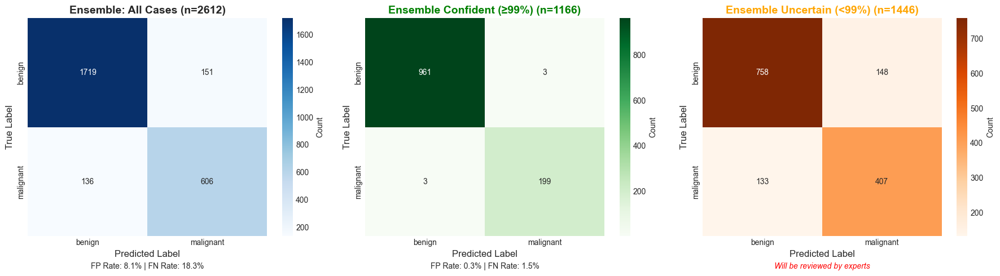


ENSEMBLE CONFUSION MATRIX STATISTICS

📊 ALL CASES (n=2612)
   True Negatives:  1719  |  False Positives:  151
   False Negatives:  136  |  True Positives:   606
   FP Rate: 8.07%  |  FN Rate: 18.33%

✅ CONFIDENT CASES (n=1166, 44.6%)
   True Negatives:   961  |  False Positives:    3
   False Negatives:    3  |  True Positives:   199
   FP Rate: 0.31%  |  FN Rate: 1.49%

⚠️  UNCERTAIN CASES (n=1446, 55.4%)
   True Negatives:   758  |  False Positives:  148
   False Negatives:  133  |  True Positives:   407

🚨 IMPORTANT: 540 malignant cases in uncertain set!
   → These MUST be reviewed by expert dermatologists


In [24]:
# ============================================================
# ENSEMBLE CONFUSION MATRICES
# ============================================================

print("="*80)
print(f"ENSEMBLE CONFUSION MATRICES AT THRESHOLD: {OPTIMAL_ENSEMBLE_THRESHOLD:.0%}")
print("="*80)

# Get data for selected threshold
ens_selected_data = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]
ens_confident_mask = ens_selected_data['confident_mask']
ens_uncertain_mask = ~ens_confident_mask

# Get confusion matrices
ens_cm_confident = ens_selected_data['confusion_matrix']

# Calculate uncertain confusion matrix
if ens_uncertain_mask.sum() > 0:
    ens_unc_labels = ens_labels[ens_uncertain_mask]
    ens_unc_preds = ens_predictions[ens_uncertain_mask]
    ens_cm_uncertain = confusion_matrix(ens_unc_labels, ens_unc_preds)
else:
    ens_cm_uncertain = np.array([[0, 0], [0, 0]])

# Overall confusion matrix
ens_cm_all = confusion_matrix(ens_labels, ens_predictions)
ens_tn_all, ens_fp_all, ens_fn_all, ens_tp_all = ens_cm_all.ravel()

# Extract values for confident/uncertain
if ens_cm_confident.size == 4:
    ens_tn_conf, ens_fp_conf, ens_fn_conf, ens_tp_conf = ens_cm_confident.ravel()
else:
    ens_tn_conf, ens_fp_conf, ens_fn_conf, ens_tp_conf = 0, 0, 0, 0

if ens_cm_uncertain.size == 4:
    ens_tn_unc, ens_fp_unc, ens_fn_unc, ens_tp_unc = ens_cm_uncertain.ravel()
else:
    ens_tn_unc, ens_fp_unc, ens_fn_unc, ens_tp_unc = 0, 0, 0, 0

# Create figure with 3 confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

CLASS_NAMES = ['benign', 'malignant']

# 1. ALL CASES
sns.heatmap(ens_cm_all, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_title(f'Ensemble: All Cases (n={len(ens_predictions)})', fontsize=14, fontweight='bold')
axes[0].set_ylabel('True Label', fontsize=12)
axes[0].set_xlabel('Predicted Label', fontsize=12)

# Add FP/FN rates
ens_fp_rate = ens_fp_all / (ens_tn_all + ens_fp_all) if (ens_tn_all + ens_fp_all) > 0 else 0
ens_fn_rate = ens_fn_all / (ens_fn_all + ens_tp_all) if (ens_fn_all + ens_tp_all) > 0 else 0
axes[0].text(0.5, -0.15, f'FP Rate: {ens_fp_rate:.1%} | FN Rate: {ens_fn_rate:.1%}', 
             ha='center', transform=axes[0].transAxes, fontsize=10)

# 2. CONFIDENT CASES
ens_confident_count = np.sum(ens_confident_mask)
sns.heatmap(ens_cm_confident, annot=True, fmt='d', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], cbar_kws={'label': 'Count'})
axes[1].set_title(f'Ensemble Confident (≥{OPTIMAL_ENSEMBLE_THRESHOLD:.0%}) (n={ens_confident_count})', 
                  fontsize=14, fontweight='bold', color='green')
axes[1].set_ylabel('True Label', fontsize=12)
axes[1].set_xlabel('Predicted Label', fontsize=12)

# Add confidence metrics
if (ens_tn_conf + ens_fp_conf) > 0 and (ens_fn_conf + ens_tp_conf) > 0:
    ens_fp_rate_conf = ens_fp_conf / (ens_tn_conf + ens_fp_conf)
    ens_fn_rate_conf = ens_fn_conf / (ens_fn_conf + ens_tp_conf)
    axes[1].text(0.5, -0.15, f'FP Rate: {ens_fp_rate_conf:.1%} | FN Rate: {ens_fn_rate_conf:.1%}', 
                 ha='center', transform=axes[1].transAxes, fontsize=10)

# 3. UNCERTAIN CASES
ens_uncertain_count = np.sum(ens_uncertain_mask)
sns.heatmap(ens_cm_uncertain, annot=True, fmt='d', cmap='Oranges',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[2], cbar_kws={'label': 'Count'})
axes[2].set_title(f'Ensemble Uncertain (<{OPTIMAL_ENSEMBLE_THRESHOLD:.0%}) (n={ens_uncertain_count})', 
                  fontsize=14, fontweight='bold', color='orange')
axes[2].set_ylabel('True Label', fontsize=12)
axes[2].set_xlabel('Predicted Label', fontsize=12)

axes[2].text(0.5, -0.15, 'Will be reviewed by experts', 
             ha='center', transform=axes[2].transAxes, fontsize=10, 
             style='italic', color='red')

plt.tight_layout()
plt.savefig('images/ensemble_confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\n" + "="*80)
print("ENSEMBLE CONFUSION MATRIX STATISTICS")
print("="*80)

print(f"\n📊 ALL CASES (n={len(ens_predictions)})")
print(f"   True Negatives:  {ens_tn_all:4d}  |  False Positives: {ens_fp_all:4d}")
print(f"   False Negatives: {ens_fn_all:4d}  |  True Positives:  {ens_tp_all:4d}")
print(f"   FP Rate: {ens_fp_rate:.2%}  |  FN Rate: {ens_fn_rate:.2%}")

print(f"\n✅ CONFIDENT CASES (n={ens_confident_count}, {100*ens_confident_count/len(ens_predictions):.1f}%)")
print(f"   True Negatives:  {ens_tn_conf:4d}  |  False Positives: {ens_fp_conf:4d}")
print(f"   False Negatives: {ens_fn_conf:4d}  |  True Positives:  {ens_tp_conf:4d}")
if (ens_tn_conf + ens_fp_conf) > 0 and (ens_fn_conf + ens_tp_conf) > 0:
    print(f"   FP Rate: {ens_fp_rate_conf:.2%}  |  FN Rate: {ens_fn_rate_conf:.2%}")

print(f"\n⚠️  UNCERTAIN CASES (n={ens_uncertain_count}, {100*ens_uncertain_count/len(ens_predictions):.1f}%)")
print(f"   True Negatives:  {ens_tn_unc:4d}  |  False Positives: {ens_fp_unc:4d}")
print(f"   False Negatives: {ens_fn_unc:4d}  |  True Positives:  {ens_tp_unc:4d}")

# Flag uncertain malignant cases
ens_uncertain_malignant = np.sum(ens_labels[ens_uncertain_mask] == 1)
if ens_uncertain_malignant > 0:
    print(f"\n🚨 IMPORTANT: {ens_uncertain_malignant} malignant cases in uncertain set!")
    print(f"   → These MUST be reviewed by expert dermatologists")
else:
    print(f"\n✓ No malignant cases in uncertain set")

print("="*80)



📊 ENSEMBLE VS SINGLE MODEL COMPARISON

Comparison at 99% Threshold:
--------------------------------------------------------------------------------

Metric                    Single Model    Ensemble (3)    Improvement
--------------------------------------------------------------------------------
Recall                    0.9800        0.9851        +0.0051 (+0.5%)
Precision                 0.9800        0.9851        +0.0051 (+0.5%)
Accuracy                  0.9919        0.9949        +0.0030 (+0.3%)
F1-Score                  0.9800        0.9851        +0.0051 (+0.5%)
Coverage                  0.4698        0.4464        -0.0234 (-5.0%)
Uncertain Malignant       492             540             +48

Missed Cancers (FN)       5               3               -2 (-40.0%)
--------------------------------------------------------------------------------


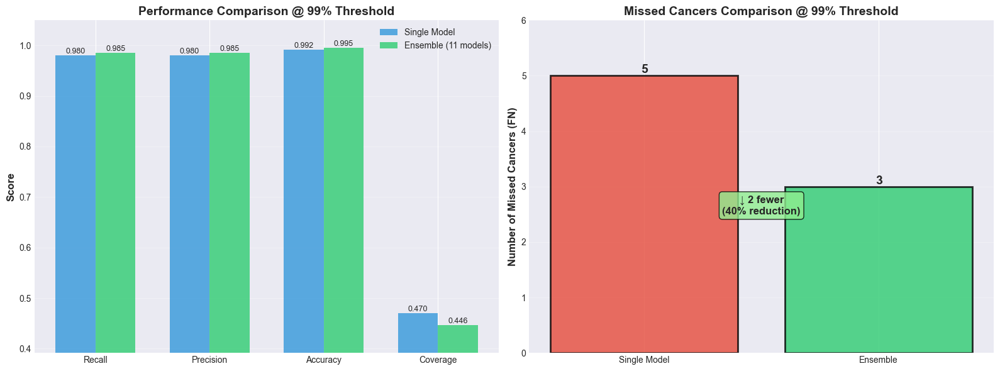


🏥 CLINICAL IMPACT: ENSEMBLE IMPROVEMENT

📊 Cancer Detection:
   Total malignant cases: 742

   Single Model:
     Caught confidently: 245 (33.0%)
     Missed (FN): 5 (0.7%)

   Ensemble (11 models):
     Caught confidently: 199 (26.8%)
     Missed (FN): 3 (0.4%)

   ✅ IMPROVEMENT: 2 additional cancer(s) detected!
      2 potential life/lives saved

📋 Workload:
   Single: 47.0% automated, 53.0% needs review
   Ensemble: 44.6% automated, 55.4% needs review
   ⚠️ Ensemble handles 2.3% fewer cases

✅ ENSEMBLE EVALUATION COMPLETE


In [25]:
# ============================================================
# ENSEMBLE VS SINGLE MODEL COMPARISON
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n" + "="*80)
print("📊 ENSEMBLE VS SINGLE MODEL COMPARISON")
print("="*80)


# Compare at 90% threshold
print(f"\nComparison at {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold:")
print("-"*80)


# Get metric
single_90 = threshold_data[OPTIMAL_THRESHOLD]['metrics']
ensemble_90 = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]['metrics']


# Get confusion matrices
single_cm_90 = threshold_data[OPTIMAL_THRESHOLD]['confusion_matrix']
ensemble_cm_90 = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]['confusion_matrix']


# Calculate values
single_fn = single_cm_90[1, 0] if single_cm_90.size == 4 else 0
ensemble_fn = ensemble_cm_90[1, 0] if ensemble_cm_90.size == 4 else 0


# Print comparison table
print(f"\n{'Metric':<25} {'Single Model':<15} {'Ensemble (3)':<15} {'Improvement'}")
print("-"*80)


metrics_to_compare = [
    ('Recall', 'recall'),
    ('Precision', 'precision'),
    ('Accuracy', 'accuracy'),
    ('F1-Score', 'f1'),
    ('Coverage', 'coverage'),
    ('Uncertain Malignant', 'uncertain_malignant')
]


for display_name, metric_key in metrics_to_compare:
    if metric_key == 'f1':
        # Calculate F1
        single_val = 2 * single_90['precision'] * single_90['recall'] / (single_90['precision'] + single_90['recall']) if (single_90['precision'] + single_90['recall']) > 0 else 0
        ensemble_val = 2 * ensemble_90['precision'] * ensemble_90['recall'] / (ensemble_90['precision'] + ensemble_90['recall']) if (ensemble_90['precision'] + ensemble_90['recall']) > 0 else 0
    else:
        single_val = single_90[metric_key]
        ensemble_val = ensemble_90[metric_key]
    
    if metric_key == 'uncertain_malignant':
        # For uncertain malignant, show absolute difference
        diff = ensemble_val - single_val
        print(f"{display_name:<25} {single_val:<15.0f} {ensemble_val:<15.0f} {diff:+.0f}")
    else:
        # For percentages
        diff = ensemble_val - single_val
        pct_change = (diff / single_val * 100) if single_val > 0 else 0
        print(f"{display_name:<25} {single_val:.4f}        {ensemble_val:.4f}        {diff:+.4f} ({pct_change:+.1f}%)")


# Missed cancers
print(f"\n{'Missed Cancers (FN)':<25} {single_fn:<15.0f} {ensemble_fn:<15.0f} {ensemble_fn - single_fn:+.0f} ({(ensemble_fn - single_fn)/single_fn*100:+.1f}%)")
print("-"*80)


# ============================================================
# VISUAL COMPARISON - FIXED
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))


# Left: Metrics comparison
metrics_display = ['Recall', 'Precision', 'Accuracy', 'Coverage']
single_values = [
    single_90['recall'],
    single_90['precision'],
    single_90['accuracy'],
    single_90['coverage']
]
ensemble_values = [
    ensemble_90['recall'],
    ensemble_90['precision'],
    ensemble_90['accuracy'],
    ensemble_90['coverage']
]


x = np.arange(len(metrics_display))
width = 0.35


bars1 = axes[0].bar(x - width/2, single_values, width, label='Single Model', color='#3498db', alpha=0.8)
bars2 = axes[0].bar(x + width/2, ensemble_values, width, label=f'Ensemble ({len(ensemble_models)} models)', color='#2ecc71', alpha=0.8)


axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
axes[0].set_title(f'Performance Comparison @ {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold', fontsize=14, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics_display)
axes[0].legend(fontsize=10)

# FIX: Dynamic y-axis limits based on actual data
all_values = single_values + ensemble_values
min_val = min(all_values)
max_val = max(all_values)
y_range = max_val - min_val
# Add 10% padding on top and bottom
axes[0].set_ylim(max(0, min_val - 0.1 * y_range), max_val + 0.1 * y_range)
axes[0].grid(axis='y', alpha=0.3)


# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9)


# Right: Missed cancers comparison
categories = ['Single Model', 'Ensemble']
fn_values = [single_fn, ensemble_fn]
colors = ['#e74c3c' if fn_values[0] > fn_values[1] else '#3498db', 
          '#2ecc71' if fn_values[1] < fn_values[0] else '#e74c3c']


bars = axes[1].bar(categories, fn_values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
axes[1].set_ylabel('Number of Missed Cancers (FN)', fontsize=12, fontweight='bold')
axes[1].set_title(f'Missed Cancers Comparison @ {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold', fontsize=14, fontweight='bold')

# FIX: Better y-axis limits for missed cancers
max_fn = max(fn_values)
if max_fn > 0:
    axes[1].set_ylim(0, max_fn * 1.2)  # 20% padding on top
else:
    axes[1].set_ylim(0, 10)  # Default if no missed cancers
    
axes[1].grid(axis='y', alpha=0.3)


# Add value labels
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=14, fontweight='bold')


# Add improvement annotation
if ensemble_fn < single_fn:
    improvement = single_fn - ensemble_fn
    pct_improvement = (improvement / single_fn) * 100
    # FIX: Position annotation dynamically based on max value
    y_pos = max_fn * 0.5 if max_fn > 0 else 5
    axes[1].text(0.5, y_pos, 
                f'↓ {int(improvement)} fewer\n({pct_improvement:.0f}% reduction)',
                ha='center', fontsize=12, fontweight='bold', 
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))


plt.tight_layout()
plt.savefig('images/ensemble_vs_single_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


# ============================================================
# CLINICAL IMPACT SUMMARY
# ============================================================


print("\n" + "="*80)
print("🏥 CLINICAL IMPACT: ENSEMBLE IMPROVEMENT")
print("="*80)


total_malignant = (ens_labels == 1).sum()


print(f"\n📊 Cancer Detection:")
print(f"   Total malignant cases: {total_malignant}")


# Single model
single_caught = single_cm_90[1, 1] if single_cm_90.size == 4 else 0
print(f"\n   Single Model:")
print(f"     Caught confidently: {single_caught} ({100*single_caught/total_malignant:.1f}%)")
print(f"     Missed (FN): {single_fn} ({100*single_fn/total_malignant:.1f}%)")


# Ensemble
ensemble_caught = ensemble_cm_90[1, 1] if ensemble_cm_90.size == 4 else 0
print(f"\n   Ensemble ({len(ensemble_models)} models):")
print(f"     Caught confidently: {ensemble_caught} ({100*ensemble_caught/total_malignant:.1f}%)")
print(f"     Missed (FN): {ensemble_fn} ({100*ensemble_fn/total_malignant:.1f}%)")


# Improvement
if ensemble_fn < single_fn:
    lives_saved = single_fn - ensemble_fn
    print(f"\n   ✅ IMPROVEMENT: {lives_saved} additional cancer(s) detected!")
    print(f"      {lives_saved} potential life/lives saved")
elif ensemble_fn == single_fn:
    print(f"\n   ✓ Same performance (both miss {ensemble_fn} cancers)")
else:
    print(f"\n   ⚠️ Ensemble misses {ensemble_fn - single_fn} more cancers")


# Coverage comparison
single_coverage = single_90['coverage']
ensemble_coverage = ensemble_90['coverage']


print(f"\n📋 Workload:")
print(f"   Single: {single_coverage:.1%} automated, {1-single_coverage:.1%} needs review")
print(f"   Ensemble: {ensemble_coverage:.1%} automated, {1-ensemble_coverage:.1%} needs review")


if ensemble_coverage > single_coverage:
    print(f"   ✅ Ensemble handles {(ensemble_coverage - single_coverage)*100:.1f}% more cases automatically")
elif ensemble_coverage < single_coverage:
    print(f"   ⚠️ Ensemble handles {(single_coverage - ensemble_coverage)*100:.1f}% fewer cases")


print("\n" + "="*80)
print("✅ ENSEMBLE EVALUATION COMPLETE")
print("="*80)


## ROC Curve and AUC

ROC AUC CURVE COMPARISON

ROC AUC Scores:
  Single Model: 0.9498
  Ensemble (3 models): 0.9531
  Improvement: +0.0033 (+0.34%)


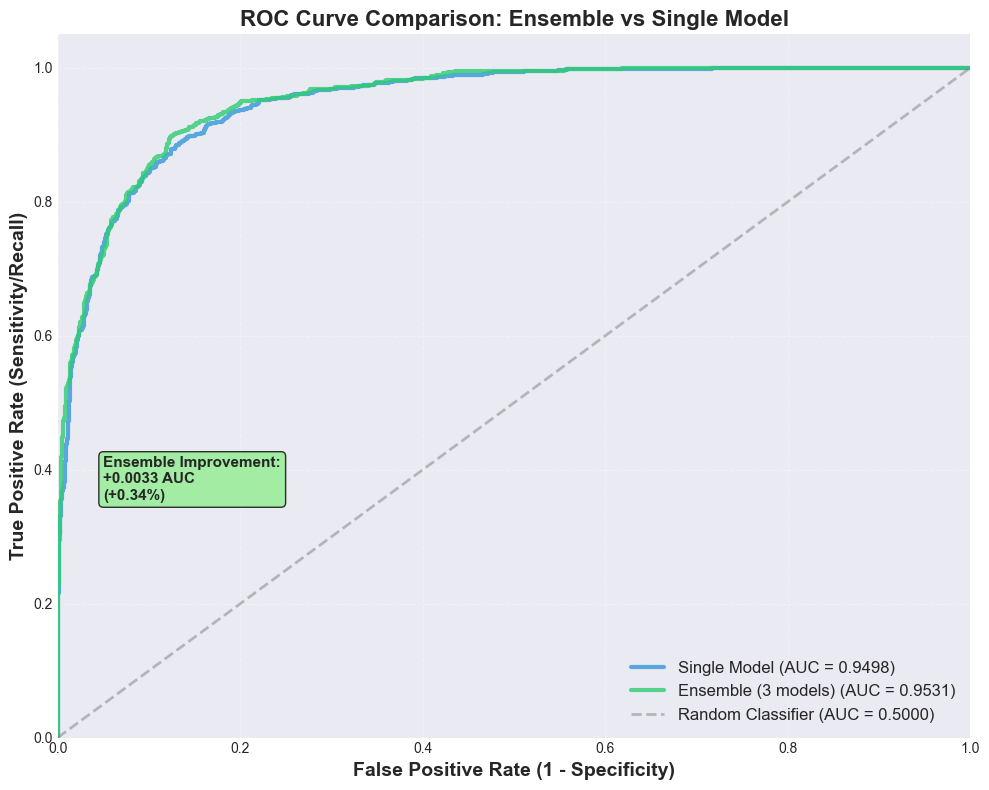


✓ ROC curve comparison saved to: efficientB3/roc_comparison_ensemble_vs_single.png

DETAILED COMPARISON AT DIFFERENT OPERATING POINTS

Operating points at fixed Sensitivity (TPR):
TPR      Model                FPR        Specificity 
--------------------------------------------------------------------------------
0.90     Single Model         0.1503    0.8497
0.90     Ensemble             0.1267    0.8733
         → FPR Reduction:     0.0235 (15.7%)

0.95     Single Model         0.2203    0.7797
0.95     Ensemble             0.2011    0.7989
         → FPR Reduction:     0.0193 (8.7%)

0.98     Single Model         0.3674    0.6326
0.98     Ensemble             0.3583    0.6417
         → FPR Reduction:     0.0091 (2.5%)

0.99     Single Model         0.4663    0.5337
0.99     Ensemble             0.4144    0.5856
         → FPR Reduction:     0.0519 (11.1%)

✓ ROC AUC Analysis Complete


In [26]:
# ============================================================
# ROC AUC COMPARISON: ENSEMBLE VS SINGLE MODEL
# ============================================================

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np

print("="*80)
print("ROC AUC CURVE COMPARISON")
print("="*80)

# Extract data from single model TTA results
single_labels = tta_results['labels']
single_probs = tta_results['probabilities'][:, 1]  # Probability of malignant class

# Extract data from ensemble TTA results
ens_labels = ensemble_results['labels']
ens_probs = ensemble_results['probabilities'][:, 1]  # Probability of malignant class

# Verify labels are the same (sanity check)
assert np.array_equal(single_labels, ens_labels), "Labels don't match between single and ensemble!"

# Calculate ROC curves
single_fpr, single_tpr, single_thresholds = roc_curve(single_labels, single_probs)
single_auc = auc(single_fpr, single_tpr)

ens_fpr, ens_tpr, ens_thresholds = roc_curve(ens_labels, ens_probs)
ens_auc = auc(ens_fpr, ens_tpr)

# Calculate improvement
auc_improvement = ens_auc - single_auc
pct_improvement = (auc_improvement / single_auc) * 100

print(f"\nROC AUC Scores:")
print(f"  Single Model: {single_auc:.4f}")
print(f"  Ensemble (3 models): {ens_auc:.4f}")
print(f"  Improvement: {auc_improvement:+.4f} ({pct_improvement:+.2f}%)")

# ============================================================
# PLOT ROC CURVES
# ============================================================

fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Plot single model ROC
ax.plot(single_fpr, single_tpr, 
        color='#3498db', linewidth=3, 
        label=f'Single Model (AUC = {single_auc:.4f})', 
        alpha=0.8)

# Plot ensemble ROC
ax.plot(ens_fpr, ens_tpr, 
        color='#2ecc71', linewidth=3, 
        label=f'Ensemble (3 models) (AUC = {ens_auc:.4f})', 
        alpha=0.8)

# Plot diagonal (random classifier)
ax.plot([0, 1], [0, 1], 
        color='gray', linewidth=2, 
        linestyle='--', 
        label='Random Classifier (AUC = 0.5000)',
        alpha=0.5)

# Styling
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate (1 - Specificity)', fontsize=14, fontweight='bold')
ax.set_ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=14, fontweight='bold')
ax.set_title('ROC Curve Comparison: Ensemble vs Single Model', fontsize=16, fontweight='bold')
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)
ax.grid(True, alpha=0.3, linestyle='--')

# Add text box with improvement (moved to avoid overlap with legend)
textstr = f'Ensemble Improvement:\n+{auc_improvement:.4f} AUC\n({pct_improvement:+.2f}%)'
props = dict(boxstyle='round', facecolor='lightgreen' if auc_improvement > 0 else 'lightyellow', alpha=0.8)
ax.text(0.05, 0.40, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', bbox=props, fontweight='bold')

plt.tight_layout()
plt.savefig('images/roc_comparison_ensemble_vs_single.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ ROC curve comparison saved to: efficientB3/roc_comparison_ensemble_vs_single.png")

# ============================================================
# ADDITIONAL STATISTICS
# ============================================================

print("\n" + "="*80)
print("DETAILED COMPARISON AT DIFFERENT OPERATING POINTS")
print("="*80)

# Find operating points at specific TPR (sensitivity) values
target_tprs = [0.90, 0.95, 0.98, 0.99]

print("\nOperating points at fixed Sensitivity (TPR):")
print(f"{'TPR':<8} {'Model':<20} {'FPR':<10} {'Specificity':<12}")
print("-"*80)

for target_tpr in target_tprs:
    # Single model
    idx_single = np.argmin(np.abs(single_tpr - target_tpr))
    single_fpr_at_tpr = single_fpr[idx_single]
    single_spec = 1 - single_fpr_at_tpr
    
    # Ensemble
    idx_ens = np.argmin(np.abs(ens_tpr - target_tpr))
    ens_fpr_at_tpr = ens_fpr[idx_ens]
    ens_spec = 1 - ens_fpr_at_tpr
    
    print(f"{target_tpr:.2f}     {'Single Model':<20} {single_fpr_at_tpr:.4f}    {single_spec:.4f}")
    print(f"{target_tpr:.2f}     {'Ensemble':<20} {ens_fpr_at_tpr:.4f}    {ens_spec:.4f}")
    
    # Calculate improvement
    fpr_reduction = single_fpr_at_tpr - ens_fpr_at_tpr
    if fpr_reduction > 0:
        print(f"         {'→ FPR Reduction:':<20} {fpr_reduction:.4f} ({fpr_reduction/single_fpr_at_tpr*100:.1f}%)")
    print()

print("="*80)
print("✓ ROC AUC Analysis Complete")
print("="*80)


## Visualize Predictions

VISUALIZING ENSEMBLE PREDICTIONS

Correct Predictions:


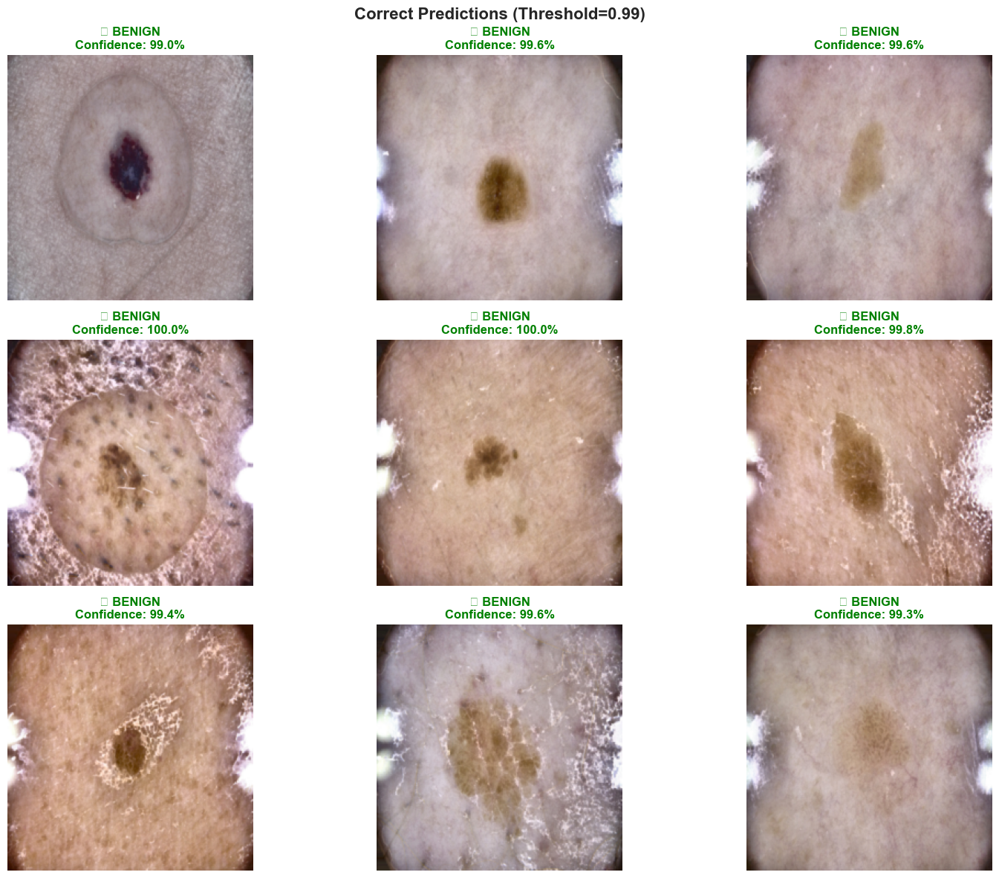


Incorrect Predictions:


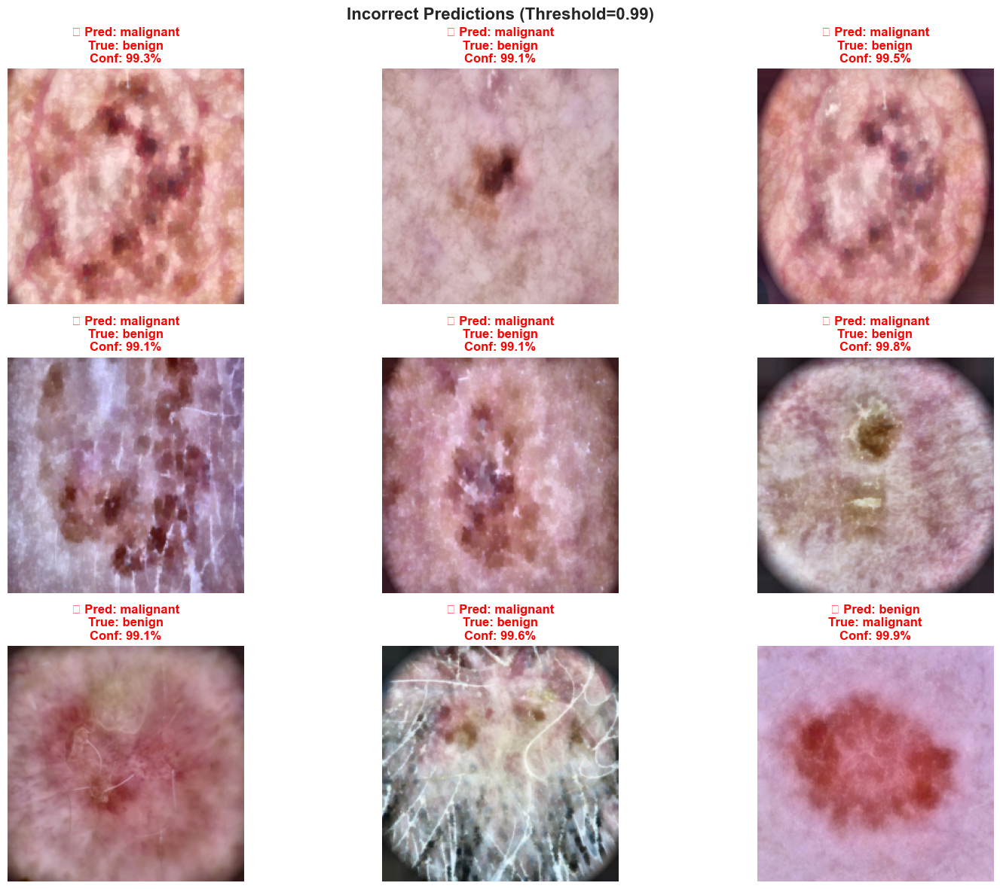

✓ Visualization complete
  Using ensemble of 11 models
  Threshold: 99%


In [27]:
def denormalize_image(img_tensor):
    """Denormalize image for visualization."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    mean = np.array(IMAGENET_MEAN).reshape(1, 1, 3)  # Shape: (1, 1, 3)
    std = np.array(IMAGENET_STD).reshape(1, 1, 3)    # Shape: (1, 1, 3)
    img = std * img + mean  # Denormalize
    img = np.clip(img, 0, 1)
    return img

def visualize_predictions(models, test_loader, num_images=12, show_incorrect=False, threshold=0.40):
    """
    Visualize model predictions.
    
    Args:
        models: Single model or list of models (for ensemble)
        test_loader: DataLoader for test data
        num_images: Number of images to display
        show_incorrect: If True, show only incorrect predictions; if False, show only correct
        threshold: Probability threshold for malignant classification
    """
    # Handle both single model and ensemble
    if not isinstance(models, list):
        models = [models]
    
    # Set all models to eval mode
    for model in models:
        model.eval()
    
    images_shown = 0
    fig, axes = plt.subplots(3, 3, figsize=(16, 12))
    axes = axes.ravel()
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            
            # Get predictions from all models and average
            all_probs = []
            for model in models:
                outputs = model(images)
                probs = torch.softmax(outputs, dim=1)
                all_probs.append(probs)
            
            # Average across all models (ensemble prediction)
            avg_probs = torch.stack(all_probs).mean(dim=0)
            malignant_probs = avg_probs[:, 1]  # Get malignant class probability
            preds = (malignant_probs >= threshold).long()
            
            for i in range(len(images)):
                if images_shown >= num_images:
                    break
                
                is_correct = (preds[i] == labels[i]).item()
                
                # Calculate confidence in predicted class
                malignant_prob = malignant_probs[i].item()
                if preds[i].item() == 1:  # Predicted malignant
                    pred_confidence = malignant_prob
                else:  # Predicted benign
                    pred_confidence = 1 - malignant_prob
                
                # Filter based on confidence threshold
                if pred_confidence < threshold:
                    continue
                
                # Filter based on correctness
                if show_incorrect and is_correct:
                    continue
                if not show_incorrect and not is_correct:
                    continue
                
                # Denormalize and show image
                img = denormalize_image(images[i])
                axes[images_shown].imshow(img)
                
                # Create title
                true_label = idx_to_class[labels[i].item()]
                pred_label = idx_to_class[preds[i].item()]
                
                # FIXED: Show confidence in the predicted class
                malignant_prob = malignant_probs[i].item()
                if preds[i].item() == 1:  # Predicted malignant
                    confidence = malignant_prob * 100
                else:  # Predicted benign
                    confidence = (1 - malignant_prob) * 100
                
                if is_correct:
                    color = 'green'
                    title = f'✓ {pred_label.upper()}\nConfidence: {confidence:.1f}%'
                else:
                    color = 'red'
                    title = f'✗ Pred: {pred_label}\nTrue: {true_label}\nConf: {confidence:.1f}%'
                
                axes[images_shown].set_title(title, color=color, fontweight='bold')
                axes[images_shown].axis('off')
                
                images_shown += 1
            
            if images_shown >= num_images:
                break
    
    # Hide unused subplots
    for idx in range(images_shown, len(axes)):
        axes[idx].axis('off')
    
    status = 'Incorrect' if show_incorrect else 'Correct'
    plt.suptitle(f'{status} Predictions (Threshold={threshold:.2f})', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# ============================================================
# VISUALIZE ENSEMBLE PREDICTIONS
# ============================================================

print("="*80)
print("VISUALIZING ENSEMBLE PREDICTIONS")
print("="*80)

# Show correct predictions
print('\nCorrect Predictions:')
visualize_predictions(ensemble_models, test_loader, num_images=9, show_incorrect=False, threshold=OPTIMAL_ENSEMBLE_THRESHOLD)

# Show incorrect predictions
print('\nIncorrect Predictions:')
visualize_predictions(ensemble_models, test_loader, num_images=9, show_incorrect=True, threshold=OPTIMAL_ENSEMBLE_THRESHOLD)

print("="*80)
print("✓ Visualization complete")
print(f"  Using ensemble of {len(ensemble_models)} models")
print(f"  Threshold: {OPTIMAL_ENSEMBLE_THRESHOLD:.0%}")
print("="*80)


Grad-CAM

GRAD-CAM VISUALIZATION (Using Ensemble Predictions)

Getting ensemble predictions from 11 models...
✓ Got ensemble predictions

Generating Grad-CAM using best single model...
Note: Grad-CAM uses best single model (seed 123)
      But predictions shown are from ensemble

Generating Grad-CAM visualizations...


  0%|          | 0/9 [00:00<?, ?it/s]

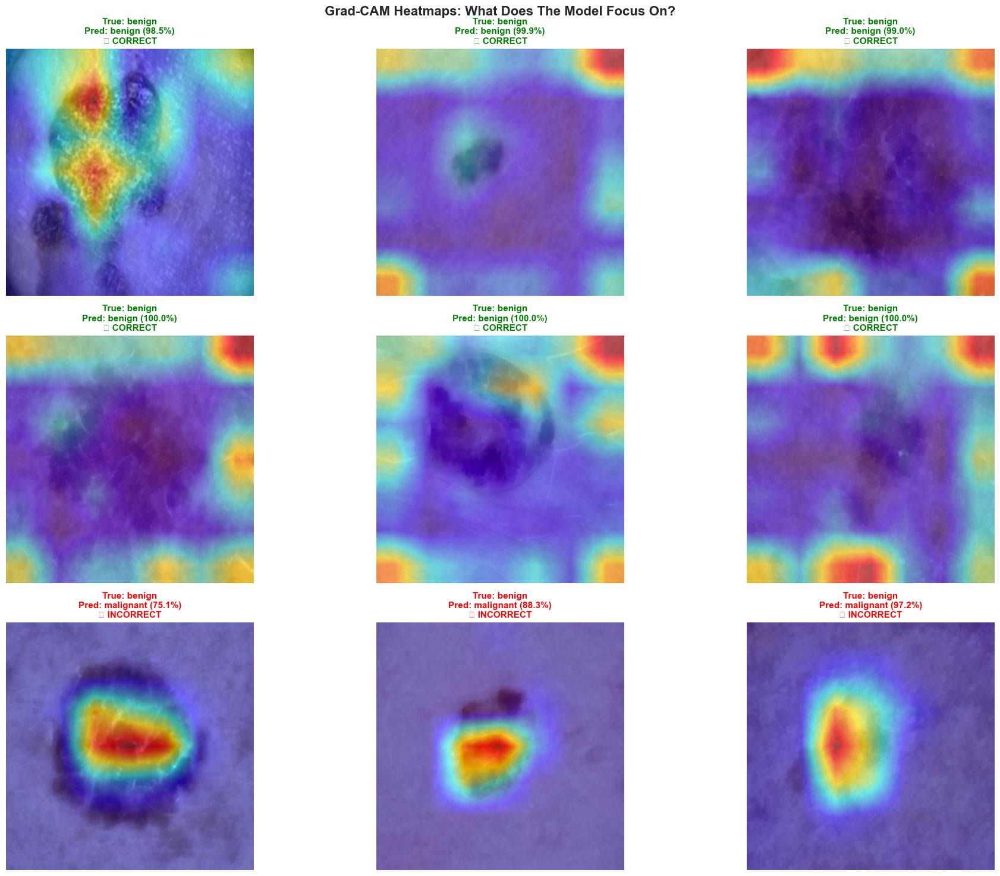


✓ Grad-CAM visualization complete

💡 Red areas = High importance for prediction
   Look for: Model focusing on lesion vs background/artifacts

INTERPRETATION GUIDE

✅ GOOD: Red heatmap concentrated on the lesion itself
⚠️  WARNING: Red areas on hair, rulers, skin marks (spurious correlations)
❌ BAD: Red areas on corners/background (model confused)

If the model focuses on the lesion: High confidence in deployment!
If the model focuses on artifacts: Need more data augmentation or cleaning.



In [28]:
# ============================================================
# GRAD-CAM VISUALIZATION - See What The Model Looks At
# ============================================================

from pytorch_grad_cam import GradCAM, HiResCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def denormalize_for_gradcam(img_tensor):
    """Denormalize image for Grad-CAM visualization."""
    img = img_tensor.cpu().numpy()
    # Denormalize
    mean = np.array(IMAGENET_MEAN).reshape(3, 1, 1)
    std = np.array(IMAGENET_STD).reshape(3, 1, 1)
    img = img * std + mean
    img = np.clip(img, 0, 1)
    img = np.transpose(img, (1, 2, 0))
    return img


def visualize_gradcam(model, images, labels, predictions, probs, num_samples=12):
    """
    Visualize Grad-CAM heatmaps showing what the model focuses on.
    """
    model.eval()
    
    # Setup Grad-CAM
    target_layers = [model.features[-1]]  # Last convolutional layer
    cam = GradCAM(model=model, target_layers=target_layers)
    
    # Select interesting samples: some correct, some incorrect
    correct_indices = np.where(predictions == labels)[0]
    incorrect_indices = np.where(predictions != labels)[0]
    
    # Get a mix
    selected_correct = np.random.choice(correct_indices, min(6, len(correct_indices)), replace=False)
    selected_incorrect = np.random.choice(incorrect_indices, min(6, len(incorrect_indices)), replace=False)
    selected_indices = np.concatenate([selected_correct, selected_incorrect])[:num_samples]
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    axes = axes.flatten()
    
    print("Generating Grad-CAM visualizations...")
    
    for idx, sample_idx in enumerate(tqdm(selected_indices)):
        img_tensor = images[sample_idx].unsqueeze(0).to(device)
        true_label = labels[sample_idx]
        pred_label = predictions[sample_idx]
        confidence = probs[sample_idx][pred_label]
        
        # Get Grad-CAM for predicted class
        targets = [ClassifierOutputTarget(pred_label)]
        
        # Generate CAM
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]
        
        # Denormalize image for visualization
        img_display = denormalize_for_gradcam(images[sample_idx])
        
        # Overlay CAM on image
        visualization = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)
        
        # Display
        axes[idx].imshow(visualization)
        
        # Title with prediction info
        true_class = CLASS_NAMES[true_label]
        pred_class = CLASS_NAMES[pred_label]
        is_correct = true_label == pred_label
        
        color = 'green' if is_correct else 'red'
        title = f'True: {true_class}\nPred: {pred_class} ({confidence:.1%})'
        if is_correct:
            title += '\n✓ CORRECT'
        else:
            title += '\n✗ INCORRECT'
        
        axes[idx].set_title(title, fontsize=11, fontweight='bold', color=color)
        axes[idx].axis('off')
    
    plt.suptitle('Grad-CAM Heatmaps: What Does The Model Focus On?', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    print("\n✓ Grad-CAM visualization complete")
    print("\n💡 Red areas = High importance for prediction")
    print("   Look for: Model focusing on lesion vs background/artifacts")


# ============================================================
# GET SAMPLES AND ENSEMBLE PREDICTIONS
# ============================================================

# Get a batch of images for visualization
sample_images = []
sample_labels = []

for i, (images_batch, labels_batch) in enumerate(test_loader):
    sample_images.append(images_batch)
    sample_labels.append(labels_batch)
    if len(sample_images) * test_loader.batch_size >= 200:
        break

sample_images = torch.cat(sample_images, dim=0)[:200]
sample_labels = torch.cat(sample_labels, dim=0)[:200]

# Get ENSEMBLE predictions for these samples
print("="*80)
print("GRAD-CAM VISUALIZATION (Using Ensemble Predictions)")
print("="*80)
print(f"\nGetting ensemble predictions from {len(ensemble_models)} models...")

all_model_probs = []
for model in ensemble_models:
    model.eval()
    with torch.no_grad():
        outputs = model(sample_images.to(device))
        probs = torch.softmax(outputs, dim=1).cpu().numpy()
        all_model_probs.append(probs)

# Average predictions across ensemble
ensemble_probs = np.mean(all_model_probs, axis=0)
ensemble_predictions = ensemble_probs.argmax(axis=1)

print(f"✓ Got ensemble predictions")
print(f"\nGenerating Grad-CAM using best single model...")

# Load best single model for Grad-CAM (load it)
best_model = SimpleConvNeXtBase(num_classes=2, pretrained=False)
checkpoint = torch.load('best_melanoma_single.pth', weights_only=False)
best_model.load_state_dict(checkpoint['model_state_dict'])
best_model = best_model.to(device)
best_model.eval()

# Get seed from checkpoint if available
model_seed = checkpoint.get('seed', 'unknown')
print(f"Note: Grad-CAM uses best single model (seed {model_seed})")
print(f"      But predictions shown are from ensemble\n")

# Visualize using best model + ensemble predictions
visualize_gradcam(
    best_model, 
    sample_images, 
    sample_labels.numpy(), 
    ensemble_predictions, 
    ensemble_probs,
    num_samples=9
)

print("\n" + "="*80)
print("INTERPRETATION GUIDE")
print("="*80)
print("""
✅ GOOD: Red heatmap concentrated on the lesion itself
⚠️  WARNING: Red areas on hair, rulers, skin marks (spurious correlations)
❌ BAD: Red areas on corners/background (model confused)

If the model focuses on the lesion: High confidence in deployment!
If the model focuses on artifacts: Need more data augmentation or cleaning.
""")


GETTING ENSEMBLE PREDICTIONS FOR SAMPLE BATCH
✓ Got ensemble predictions for 200 sample images
  Sample predictions shape: (200,)
  Sample labels shape: (200,)

ENSEMBLE GRAD-CAM ANALYSIS
Using all 11 ensemble models
Heatmaps are averaged across all models for consensus visualization
Generating ensemble Grad-CAM (averaging 11 models)...


  0%|          | 0/4 [00:00<?, ?it/s]

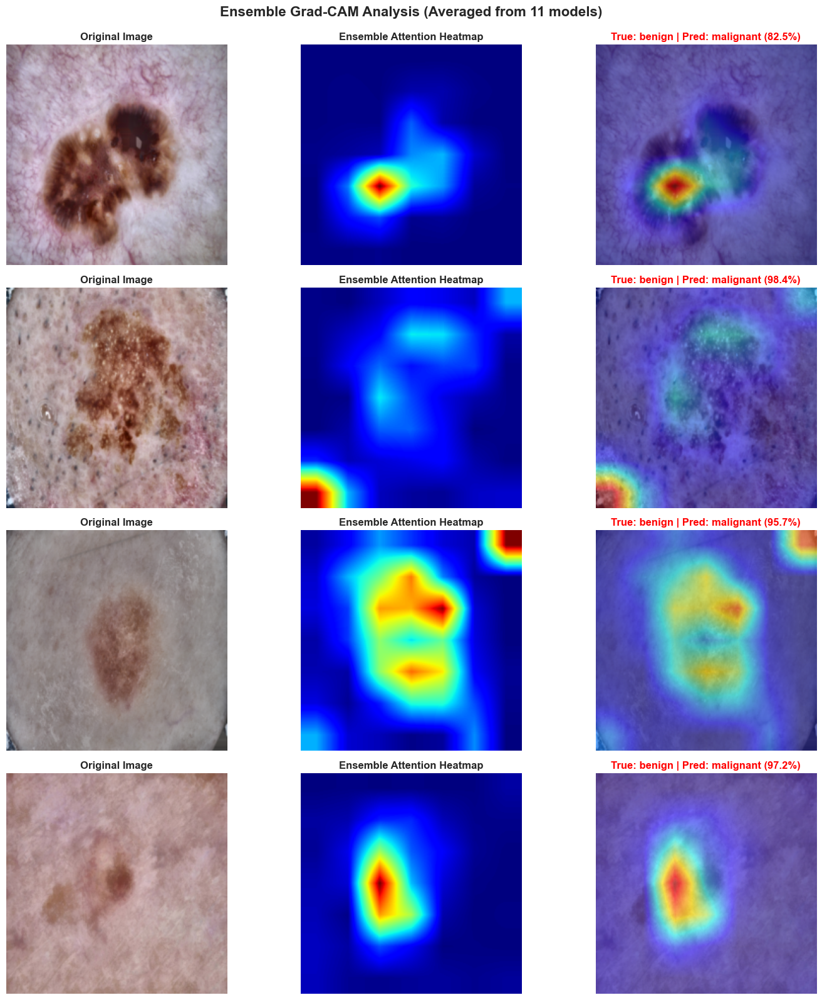

In [29]:
# ============================================================
# ENSEMBLE GRAD-CAM: Average heatmaps from all models
# ============================================================

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def visualize_ensemble_gradcam(models, images, labels, predictions, probs, num_samples=8):
    """
    Generate Grad-CAM by averaging heatmaps from all ensemble models.
    
    Args:
        models: List of ensemble models
        images: Tensor of images (from sample batch)
        labels: Array of true labels (same length as images)
        predictions: Array of predictions (same length as images)
        probs: Array of probabilities (same length as images)
    """
    # Create GradCAM for each model
    cams = []
    for model in models:
        model.eval()
        target_layers = [model.features[-1]]
        cam = GradCAM(model=model, target_layers=target_layers)
        cams.append(cam)
    
    # Select samples
    incorrect_indices = np.where(predictions != labels)[0]
    high_conf_correct = np.where((predictions == labels) & (probs.max(axis=1) > 0.9))[0]
    
    selected = np.concatenate([
        incorrect_indices[:4] if len(incorrect_indices) >= 4 else incorrect_indices,
        high_conf_correct[:4] if len(high_conf_correct) >= 4 else high_conf_correct
    ])[:num_samples]
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    print(f"Generating ensemble Grad-CAM (averaging {len(models)} models)...")
    
    for idx, sample_idx in enumerate(tqdm(selected)):
        img_tensor = images[sample_idx].unsqueeze(0).to(device)
        true_label = labels[sample_idx]
        pred_label = predictions[sample_idx]
        confidence = probs[sample_idx][pred_label]
        
        targets = [ClassifierOutputTarget(pred_label)]
        
        # Compute Grad-CAM for each model and average
        ensemble_heatmaps = []
        for cam in cams:
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0, :]
            ensemble_heatmaps.append(grayscale_cam)
        
        # Average heatmaps from all models
        avg_grayscale_cam = np.mean(ensemble_heatmaps, axis=0)
        
        img_display = denormalize_for_gradcam(images[sample_idx])
        
        # 1. Original image
        axes[idx, 0].imshow(img_display)
        axes[idx, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[idx, 0].axis('off')
        
        # 2. Averaged heatmap
        axes[idx, 1].imshow(avg_grayscale_cam, cmap='jet')
        axes[idx, 1].set_title('Ensemble Attention Heatmap', fontsize=12, fontweight='bold')
        axes[idx, 1].axis('off')
        
        # 3. Overlay
        visualization = show_cam_on_image(img_display, avg_grayscale_cam, use_rgb=True)
        axes[idx, 2].imshow(visualization)
        
        true_class = CLASS_NAMES[true_label]
        pred_class = CLASS_NAMES[pred_label]
        is_correct = true_label == pred_label
        color = 'green' if is_correct else 'red'
        
        title = f'True: {true_class} | Pred: {pred_class} ({confidence:.1%})'
        axes[idx, 2].set_title(title, fontsize=12, fontweight='bold', color=color)
        axes[idx, 2].axis('off')
    
    plt.suptitle(f'Ensemble Grad-CAM Analysis (Averaged from {len(models)} models)', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig('images/ensemble_gradcam_analysis.png')
    plt.show()


# ============================================================
# GET PREDICTIONS FOR SAMPLE BATCH
# ============================================================

print("\n" + "="*80)
print("GETTING ENSEMBLE PREDICTIONS FOR SAMPLE BATCH")
print("="*80)

# Get ensemble predictions for the sample batch specifically
sample_images_device = sample_images.to(device)
sample_ensemble_probs = []

for model in ensemble_models:
    model.eval()
    with torch.no_grad():
        outputs = model(sample_images_device)
        probs = torch.softmax(outputs, dim=1)
        sample_ensemble_probs.append(probs.cpu().numpy())

# Average probabilities across ensemble
sample_avg_probs = np.mean(sample_ensemble_probs, axis=0)
sample_predictions = np.argmax(sample_avg_probs, axis=1)

print(f"✓ Got ensemble predictions for {len(sample_images)} sample images")
print(f"  Sample predictions shape: {sample_predictions.shape}")
print(f"  Sample labels shape: {sample_labels.numpy().shape}")

# ============================================================
# RUN ENSEMBLE GRAD-CAM VISUALIZATION
# ============================================================

print("\n" + "="*80)
print("ENSEMBLE GRAD-CAM ANALYSIS")
print("="*80)
print(f"Using all {len(ensemble_models)} ensemble models")
print("Heatmaps are averaged across all models for consensus visualization")
print("="*80)

visualize_ensemble_gradcam(
    ensemble_models,           # Use all 3 ensemble models
    sample_images,             # Sample batch images
    sample_labels.numpy(),     # Sample batch labels
    sample_predictions,        # Ensemble predictions for sample batch
    sample_avg_probs,          # Ensemble probabilities for sample batch
    num_samples=4
)